# OneK1K aging signature analysis

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os,sys
import numpy as np
import anndata
import pandas as pd
import mudata as md
import scanpy as sc
import glob
from tqdm import tqdm
import scipy
import pertpy
import yaml

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

from copy import deepcopy

import process as process
import plot as plot

mpl.rcParams['pdf.fonttype'] = 42  # Embed fonts as TrueType
mpl.rcParams['font.family'] = 'sans-serif'
mpl.rcParams['font.sans-serif'] = ['Arial', 'Helvetica', 'DejaVu Sans']
plt.rcParams['figure.autolayout'] = True
plt.rcParams['figure.dpi'] = 300  # or 150, 200, etc.
plt.rcParams['savefig.dpi'] = 300

# Increase all font sizes
plt.rcParams['font.size'] = 16  # Base font size
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['xtick.labelsize'] = 15
plt.rcParams['ytick.labelsize'] = 15
plt.rcParams['legend.fontsize'] = 15

sys.path.append('../3_DE_analysis')
from DE_analysis_utils import *

/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/anndata/utils.py:435: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/anndata/utils.py:435: FutureWarning: Importing read_loom from `anndata` is deprecated. Import anndata.io.read_loom instead.
  warnings.warn(msg, FutureWarning)
/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/anndata/utils.py:435: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)
/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/anndata/utils.py:435: FutureWarning: Importing CSCDataset from `anndata.experimental` is deprecated. Import anndata.abc.CSCDataset instead.
  warnings.warn(msg, FutureWarning)
/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/

In [3]:
with open('../../metadata/figure_palettes.yaml', 'r') as f:
    palettes = yaml.safe_load(f)

In [4]:
# OAKPATH = '/oak/stanford/groups/pritch/'
OAKPATH='/mnt/oak/'
datadir = f'{OAKPATH}/users/emma/data/GWT/OneK1K_analysis/'
figdir = 'figures/'
resultsdir = 'results/'
h5ad_file = '/mnt/oak/users/emma/data/cxg_datasets/Yazar2022.h5ad'

def parse_gene_sets(filename):
   gene_sets = {}
   with open(filename, 'r') as f:
       for line in f:
           terms = line.strip().split('\t')
           gene_sets[terms[0]] = terms[2:]
   return gene_sets
KEGG_sets = parse_gene_sets(f'{OAKPATH}/users/emma/data//KEGG_2019_Human.txt')


In [5]:
os.listdir(datadir)
f'{OAKPATH}/users/emma/data/GWT/OneK1K_analysis/cell_type_counts_full.csv'

'/mnt/oak//users/emma/data/GWT/OneK1K_analysis/cell_type_counts_full.csv'

### Preprocess data by celltype

In [ ]:
ct_classes = {
    "CD4T":['central memory CD4-positive, alpha-beta T cell', 'naive thymus-derived CD4-positive, alpha-beta T cell', 'effector memory CD4-positive, alpha-beta T cell'],
    "CD8T":['effector memory CD8-positive, alpha-beta T cell', 'naive thymus-derived CD8-positive, alpha-beta T cell', 'central memory CD8-positive, alpha-beta T cell'],
    "B":['naive B cell', 'memory B cell'],
    'NK':['natural killer cell','CD16-negative, CD56-bright natural killer cell, human']
}

for ct in ct_classes.keys():
    keep_cell_types = ct_classes[ct]
    output_file = datadir + f"Yazar2022_{ct}_processed.h5ad"
    print(output_file)
    adata_1k1k = anndata.experimental.read_lazy(h5ad_file)
    adata = anndata.AnnData(
                obs=adata_1k1k.obs.to_dataframe(),
                var=adata_1k1k.var.to_dataframe(),
                X = adata_1k1k.X
            )
    adata = adata[adata.obs['cell_type'].isin(keep_cell_types)].to_memory()

    # Normalize
    scales_counts = sc.pp.normalize_total(adata, target_sum=None, inplace=False)
    adata.layers["log1p_norm"] = sc.pp.log1p(scales_counts["X"], copy=True)

    # QC
    gene_name_col = 'feature_name'
    counts_col = 'nCount_RNA'
    adata.var["mt"] = adata.var[gene_name_col].str.startswith("MT-")
    adata.var["ribo"] = adata.var[gene_name_col].str.startswith(("RPS", "RPL"))
    adata.var["hb"] = adata.var[gene_name_col].str.contains("^HB[^(P)]")
    sc.pp.calculate_qc_metrics(adata, qc_vars=["mt", "ribo", "hb"], inplace=True, percent_top=[20], log1p=True)
    adata = process.filter_outliers(adata)

    sc.pp.highly_variable_genes(adata, layer="log1p_norm", n_top_genes=10000)
    adata.write(output_file, compression="gzip")

Check CD4 t cells

In [7]:
h5ad_file = '/mnt/oak/users/emma/data/cxg_datasets/Yazar2022.h5ad'
datadir = '/mnt/oak/users/emma/data/GWT/OneK1K_analysis/'
figdir = 'figures/'
resultsdir = 'results/'

load_processed_data = True
ct = 'CD4T'

h5ad_file_processed = datadir + f"Yazar2022_{ct}_processed.h5ad"
adata_1k1k = anndata.experimental.read_lazy(h5ad_file_processed)
adata = anndata.AnnData(
        obs=adata_1k1k.obs.to_dataframe(),
        var=adata_1k1k.var.to_dataframe(),
        X = adata_1k1k.X
    )
adata = adata.to_memory()

In [ ]:
# from process import categorize_age
# adata.obs["age_cat"] = adata.obs["age"].apply(categorize_age).astype(str)

# sc.pp.normalize_total(adata) 
# sc.pp.log1p(adata) 
# adata.var_names = adata.var['feature_name'].values

### Read outputs from DE analysis

Run with `1k1k_analysis.py`

In [6]:
# get features used on perturb-seq dataset
adata_de_var = sc.read_h5ad(f'{OAKPATH}/users/emma/data/GWT/CD4i_final//DE_results_all_confounders/CD4i_final.merged_DE_results.h5ad').var
adata_de_obs = sc.read_h5ad(f'{OAKPATH}/users/emma/data/GWT/CD4i_final//DE_results_all_confounders/CD4i_final.merged_DE_results.h5ad').obs

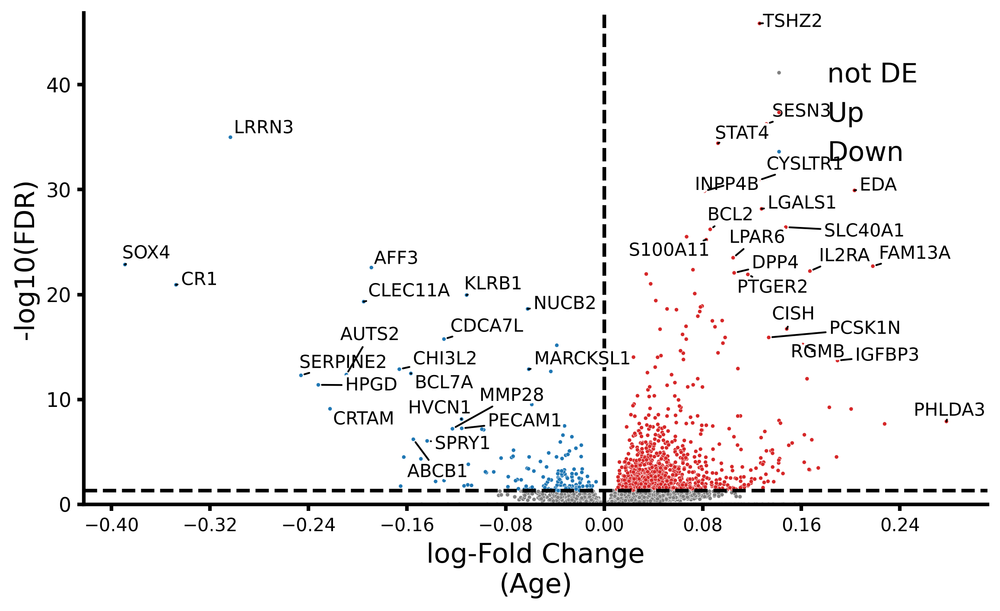

<Figure size 2400x6000 with 0 Axes>

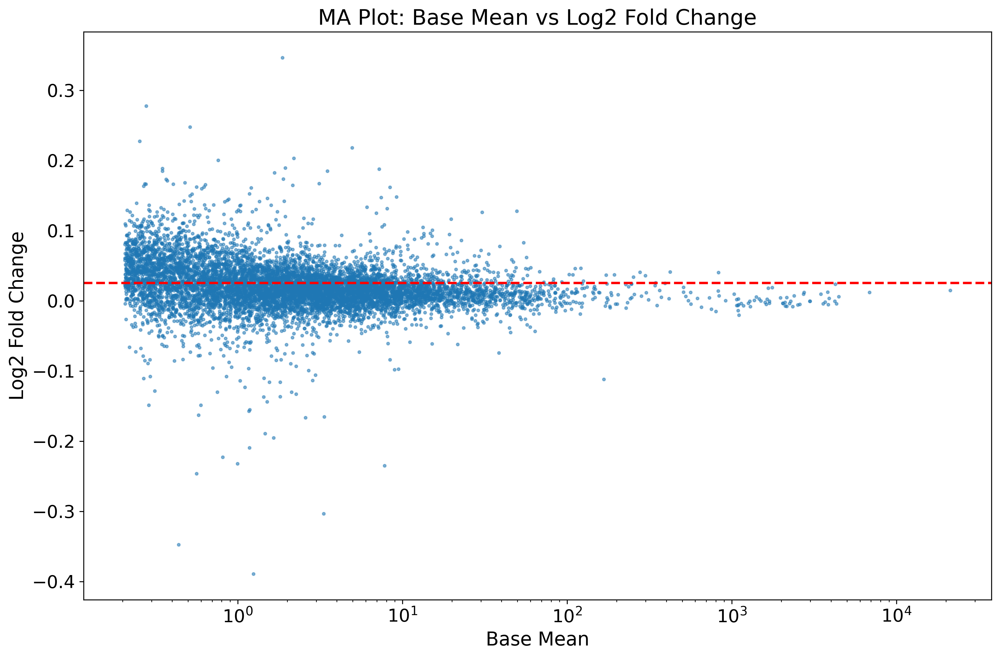

<Figure size 2400x6000 with 0 Axes>

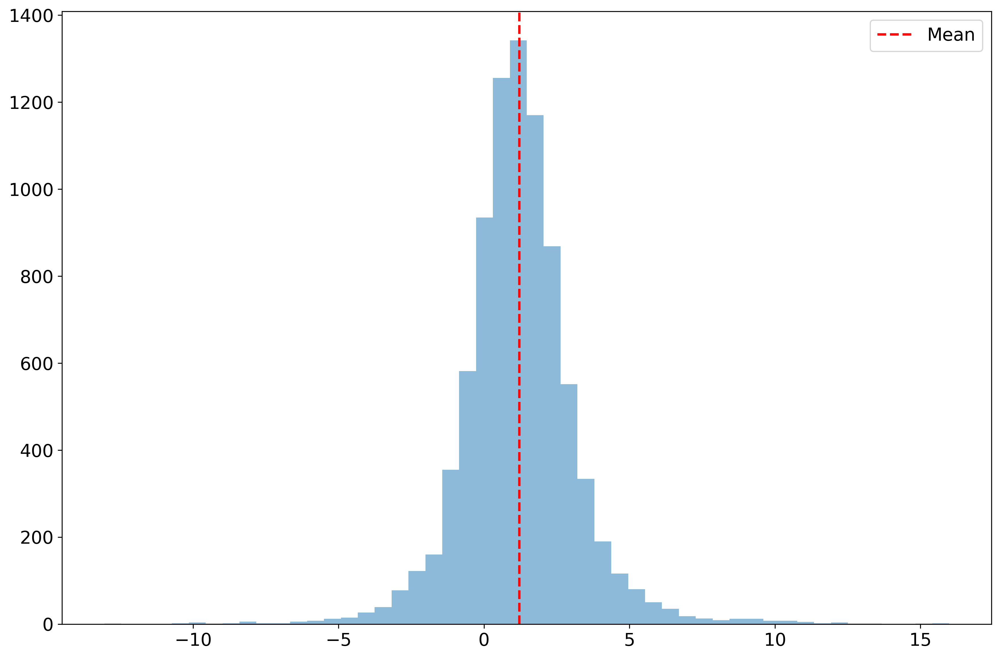

In [10]:
ct = 'CD4T'
pbulk_adata = sc.read_h5ad(datadir + f"Yazar2022_{ct}_processed.pbulk.h5ad")
pbulk_adata.var_names.isin(adata_de_var.index).sum()
res_df = pd.read_csv(f'results/DE_age_cat_{ct}_train.csv', index_col=0)
res_df = res_df.rename({'log2FoldChange':'log_fc', 'padj':'adj_p_value', 'ensembl_id':'variable'}, axis=1)
if 'variable' not in res_df.columns:
    res_df['variable'] = res_df.index.values
res_df['gene_name'] = pbulk_adata.var.loc[res_df.variable]['feature_name'].values
res_df['perturbseq_gene'] = res_df['variable'].isin(adata_de_var.index)
res_df['contrast'] = 'age'
res_df['zscore'] = res_df['log_fc']/res_df['lfcSE']
res_df['adj_p_value'] = res_df['adj_p_value'].fillna(1)

onek1k_design = f"~ male + age_cat"
model = pertpy.tl.PyDESeq2(pbulk_adata, design=onek1k_design)

fig = model.plot_volcano(
    res_df[res_df['perturbseq_gene']], 
    log2fc_thresh=0, 
    return_fig=True, 
    to_label = 20,
    symbol_col='gene_name',
    figsize=(8, 5),  # Increased figure size
    s=5,
    legend_pos = (0.95,0.95),
    y_label = '-log10(FDR)', x_label='log-Fold Change\n(Age)'
    )
fig.tight_layout()  
fig.show()  

plt.figure(figsize=(8,20))
fig = plt.figure(figsize=(12, 8))
plt.scatter(res_df[res_df.adj_p_value < 1].dropna()['baseMean'], res_df[res_df.adj_p_value < 1].dropna()['log_fc'], alpha=0.5, s=5)
plt.axhline(res_df.dropna()['log_fc'].mean(), color='red', linestyle='dashed', linewidth=2, label='Mean')
plt.xscale('log')
plt.xlabel('Base Mean')
plt.ylabel('Log2 Fold Change') 
plt.title('MA Plot: Base Mean vs Log2 Fold Change')
fig.tight_layout()
plt.show()

plt.figure(figsize=(8,20))
fig = plt.figure(figsize=(12, 8))
plt.hist(res_df[res_df.adj_p_value < 1]['zscore'], alpha=0.5, bins=50)
plt.axvline(res_df[res_df.adj_p_value < 1]['zscore'].mean(), color='red', linestyle='dashed', linewidth=2, label='Mean')
plt.legend()
fig.tight_layout()
plt.show()

In [11]:
# adata_sums = sc.read_h5ad(datadir + f"Yazar2022_{ct}_processed.pbulk.h5ad")
# adata_sums = adata_sums[:, adata_sums.X.sum(axis=0) >= 10].copy()
# # select genes measured in all pools
# aggr_data = sc.get.aggregate(adata_sums, by='pool_number', func=['count_nonzero'])
# aggr_data.layers['count_nonzero'][aggr_data.layers['count_nonzero'].nonzero()] = 1
# adata_sums.var['n_pools_measured'] = aggr_data.layers['count_nonzero'].sum(0)
# adata_sums = adata_sums[:, adata_sums.var['n_pools_measured'] == adata_sums.var['n_pools_measured'].max()]
# sc.pp.highly_variable_genes(adata_sums, layer='log1p_norm', min_mean=0.1, max_mean=10, n_top_genes=10000)
# sc.pl.highly_variable_genes(adata_sums)

### Comparison with other aging DE analysis papers

In [12]:
df = pd.read_csv('../../metadata/aging_DE_analysis/Terekhova2023_DEgenes.csv')
cell_types = [col.replace('_gene', '') for col in df.columns if col.endswith('_gene')]
long_data = []

for cell_type in cell_types:
    cols = [f"{cell_type}_gene", f"{cell_type}_logFC", f"{cell_type}_p.val", f"{cell_type}_p.adj"]
    if all(col in df.columns for col in cols):
        cell_data = df[cols].copy()
        cell_data.columns = ['gene', 'logFC', 'p_val', 'p_adj']
        cell_data['cell_type'] = cell_type
        cell_data = cell_data.dropna(subset=['gene'])
        long_data.append(cell_data)

df = pd.concat(long_data, ignore_index=True)[['cell_type', 'gene', 'logFC', 'p_val', 'p_adj']]
df[df.p_adj < 0.1].groupby('cell_type').size()


/tmp/ipykernel_1897232/2139123577.py:1: DtypeWarning: Columns (4,12,16,20,24,28,32,36,40,44,48,52,56,60) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('../../metadata/aging_DE_analysis/Terekhova2023_DEgenes.csv')


cell_type
HLA-DR+_memory      34
Naive             2019
Tfh                377
Th1                  6
Th17                31
Th1_Th17           199
Th2                 82
Th22                 1
Treg_memory          5
Treg_naive         119
dtype: int64

In [13]:
Tere2023_naive_lfc = df[df['cell_type'].isin(['Naive'])].rename(columns={'logFC':'log_fc', 'gene':'gene_name', 'p_adj':'adj_p_value'})
Tere2023_naive_lfc

,cell_type,gene_name,log_fc,p_val,adj_p_value
0,Naive,USP10,0.694998,5.646550e-20,1.572170e-15
1,Naive,TOX,-2.056441,1.683730e-19,2.344010e-15
2,Naive,SOX4,-3.158671,1.447430e-18,1.343360e-14
3,Naive,CACHD1,-2.317033,1.327800e-17,9.242470e-14
4,Naive,GTSCR1,2.003788,2.474990e-17,1.378220e-13
...,...,...,...,...,...
27838,Naive,LINC02764,-0.000028,9.996421e-01,9.997857e-01
27839,Naive,CXCL17,0.000024,9.997685e-01,9.998241e-01
27840,Naive,AL035252.2,0.000052,9.997701e-01,9.998241e-01
27841,Naive,HTRA4,0.000036,9.997937e-01,9.998241e-01


Text(0.1, 0.9, 'Pearson r = 0.44')

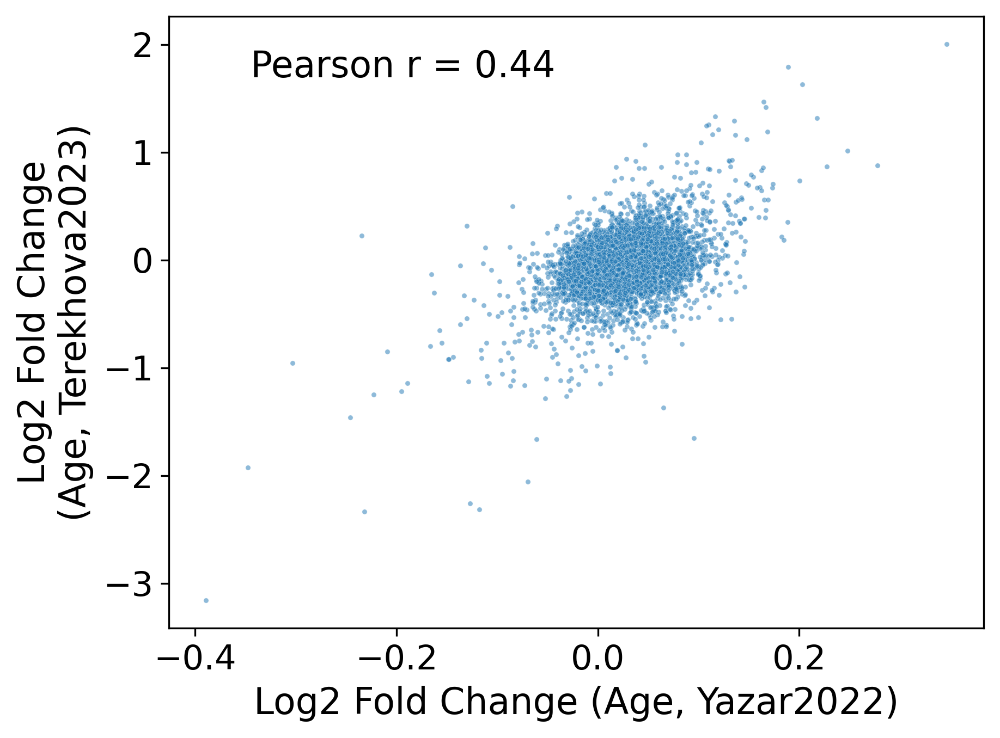

In [14]:
all_cd4T_cells = ['Naive', 'Naive-IFN', 'Tfh', 'Th1', 'Th1_Th17', 'Th17', 'Th22',
       'Th2', 'HLA-DR+_memory', 'Exhausted-like_memory',
       'Terminal_effector', 'Temra']

mean_lfc = df[df['cell_type'].isin(['Naive'])].groupby('gene')['logFC'].mean().reset_index().rename(columns={'logFC':'mean_logFC', 'gene':'gene_name'})
compare_res_df = pd.merge(res_df, mean_lfc, how='left')
sns.scatterplot(data=compare_res_df, x='log_fc', y='mean_logFC', alpha=0.5, s=5)
plt.xlabel('Log2 Fold Change (Age, Yazar2022)')
plt.ylabel('Log2 Fold Change\n(Age, Terekhova2023)')
plt.text(0.1, 0.9, f'Pearson r = {compare_res_df[["log_fc", "mean_logFC"]].corr().iloc[0,1]:.2f}', transform=plt.gca().transAxes)


In [15]:
df = pd.read_csv('../../metadata/aging_DE_analysis/Wells2025_DEgenes.csv')
matched_cts = ['cd4_naive', 'cd4_cm', 'cd4_tem']
Wells2025_naive_lfc = df[(df.assay == 'cd4_naive') & (df.tissue_group == 'blo')].rename(columns={'logfc':'log_fc', 'id':'gene_name', 'adj_p_val':'adj_p_value'})
Wells2025_cm_lfc = df[(df.assay == 'cd4_cm') & (df.tissue_group == 'blo')].rename(columns={'logfc':'log_fc', 'id':'gene_name', 'adj_p_val':'adj_p_value'})
Wells2025_tem_lfc = df[(df.assay == 'cd4_tem') & (df.tissue_group == 'blo')].rename(columns={'logfc':'log_fc', 'id':'gene_name', 'adj_p_val':'adj_p_value'})

In [16]:
variance_df = pd.read_csv('../../metadata/aging_DE_analysis/Wells2025_variance_decomp.csv')
matched_cts = ['cd4']
variance_df = variance_df[variance_df.assay.isin(matched_cts)].copy()
df = variance_df[['gene', 'cmv', 'age_groups']].rename(columns={'gene':'gene_name'})

In [17]:
# pl_df = variance_df[variance_df.cmv > variance_df.cmv.quantile(0.90)]
# sns.scatterplot(data=pl_df.sort_values('cmv'), x='gene', y='cmv', s=10, edgecolor='none');
# plt.xticks([])

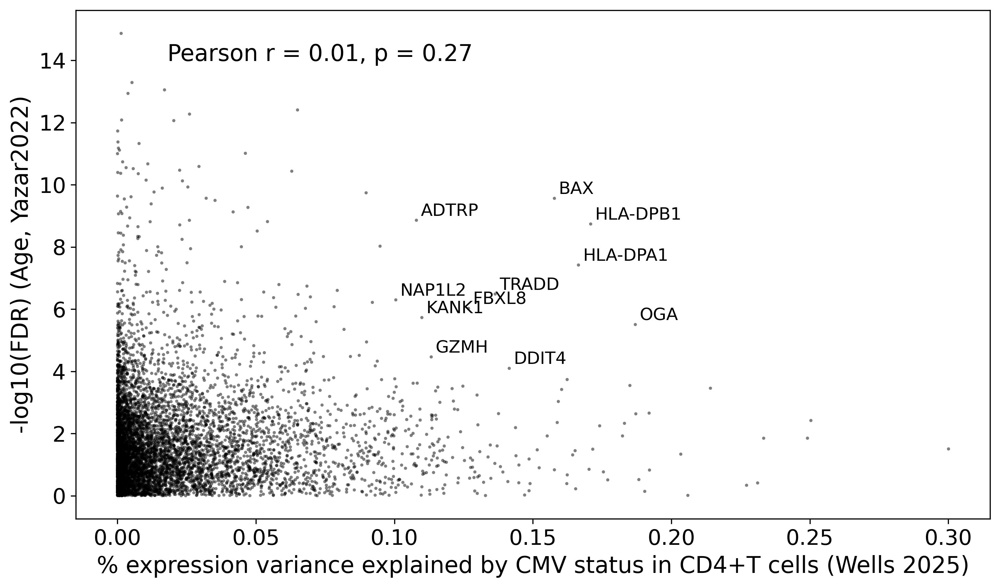

In [18]:
compare_res_df = pd.merge(res_df, df, how='left')
# compare_res_df['log10_pval'] = -np.log10(compare_res_df['adj_p_value'])
compare_res_df['log10_pval'] = np.abs(compare_res_df['zscore'])

plt.figure(figsize=(10, 6))
sns.scatterplot(data=compare_res_df, y='log10_pval', x='cmv', alpha=0.5, s=5, color='black', edgecolor='none', rasterized=True)

plt.ylabel('-log10(FDR) (Age, Yazar2022)')
plt.xlabel('% expression variance explained by CMV status in CD4+T cells (Wells 2025)')

corr_result, corr_pvalue = scipy.stats.pearsonr(compare_res_df.dropna()["log10_pval"], compare_res_df.dropna()["cmv"])
plt.text(0.1, 0.9, f'Pearson r = {corr_result:.2f}, p = {corr_pvalue:.2f}', transform=plt.gca().transAxes)

# Identify top genes to annotate based on log10_pval and cmv
top_genes = compare_res_df[(compare_res_df['log10_pval'] > 4) & (compare_res_df['cmv'] > 0.1)]

for _, row in top_genes.iterrows():
    plt.annotate(row['gene_name'], 
                 (row['cmv'], row['log10_pval']), 
                 xytext=(3, 3), 
                 textcoords='offset points', 
                 fontsize=12, 
                 color='black')

plt.savefig('./results/Yazar2022_signature_vs_CMV.pdf')
plt.savefig('./results/Yazar2022_signature_vs_CMV.png')


In [19]:
def get_reliability(x, sigma):
    sigma2_obs = np.var(x, ddof=1)  # Observed variance across features
    sigma2_sem = np.mean(sigma**2)   # Average squared standard error
    sigma2_true = sigma2_obs - sigma2_sem  # Estimated true signal variance
    reliability = sigma2_true / (sigma2_true + sigma2_sem)
    return(reliability)

def get_max_correlation(x_a, sigma_a, x_b, sigma_b):
    """Calculate maximum possible correlation"""
    rel_a = get_reliability(x_a, sigma_a)
    rel_b = get_reliability(x_b, sigma_b)
    return np.sqrt(rel_a * rel_b)

def get_lfc_correlation(x_a, sigma_a, x_b, sigma_b):
    """Calculate maximum possible correlation"""
    corr = x_a.corr(x_b)
    corr_ceil = get_max_correlation(x_a, sigma_a, x_b, sigma_b)
    return corr, corr_ceil

# Define cell type classes
ct_classes = ['CD4T', 'CD8T', 'NK', 'B']

# Dictionary to store results for each cell type
train_results = {}
val_results = {}

# Load results for each cell type
for ct in ct_classes:
    pbulk_adata = sc.read_h5ad(datadir + f"Yazar2022_{ct}_processed.pbulk.h5ad")
    pbulk_adata.var_names.isin(adata_de_var.index).sum()
    # Read and process training data
    train_df = pd.read_csv(f'results/DE_age_cat_{ct}_train.csv', index_col=0)
    train_df = train_df[(train_df['baseMean'] > 0)]
    train_df = train_df.rename({'log2FoldChange':'log_fc', 'padj':'adj_p_value', 'ensembl_id':'variable'}, axis=1)
    if 'variable' not in train_df.columns:
        train_df['variable'] = train_df.index.values
    train_df['gene_name'] = pbulk_adata.var.loc[train_df.variable]['feature_name'].values
    train_df['perturbseq_gene'] = train_df['variable'].isin(adata_de_var.index)
    train_df['zscore'] = train_df['log_fc']/train_df['lfcSE']
    train_df['adj_p_value'] = train_df['adj_p_value'].fillna(1)
    train_results[ct] = train_df

    # Read and process validation data
    val_df = pd.read_csv(f'results/DE_age_cat_{ct}_validation.csv', index_col=0)
    val_df = val_df[(val_df['baseMean'] > 0)]
    val_df = val_df.rename({'log2FoldChange':'log_fc', 'padj':'adj_p_value', 'ensembl_id':'variable'}, axis=1)
    if 'variable' not in val_df.columns:
        val_df['variable'] = val_df.index.values
    val_df['gene_name'] = pbulk_adata.var.loc[val_df.variable]['feature_name'].values
    val_df['perturbseq_gene'] = val_df['variable'].isin(adata_de_var.index)
    val_df['zscore'] = val_df['log_fc']/val_df['lfcSE']
    val_df['adj_p_value'] = val_df['adj_p_value'].fillna(1)
    val_results[ct] = val_df

# # Plot train vs validation zscores for common genes
# fig, axes = plt.subplots(1, 4, figsize=(15, 5))
# for i, ct in enumerate(ct_classes):
#     # Get genes present in both train and validation sets
#     common_genes = set(train_results[ct]['variable']) & set(val_results[ct]['variable'])
    
#     # Filter for common genes
#     train_data = train_results[ct][train_results[ct]['variable'].isin(common_genes)]
#     val_data = val_results[ct][val_results[ct]['variable'].isin(common_genes)]
    
#     train_zscore = train_data['log_fc']
#     val_zscore = val_data['log_fc']
    
#     axes[i].scatter(train_zscore, val_zscore, alpha=0.5, s=5, color='black')
#     axes[i].axhline(y=0, color='grey', linestyle=':', alpha=0.5)
#     axes[i].axvline(x=0, color='grey', linestyle=':', alpha=0.5)
#     axes[i].set_xlabel('Train zscore')
#     axes[i].set_ylabel('Validation zscore')
#     axes[i].set_title(f'{ct} (n={len(common_genes)} genes)')
# plt.tight_layout()
# plt.show()

# # Add gene names and concatenate train/val results for each cell type
# ct_train = pd.concat([train_results[ct][['zscore', 'gene_name']].rename(columns={'zscore': f'{ct}_zscore'}).set_index('gene_name') for ct in ct_classes], axis=1)
# ct_val = pd.concat([val_results[ct][['zscore', 'gene_name']].rename(columns={'zscore': f'{ct}_zscore'}).set_index('gene_name') for ct in ct_classes], axis=1)

# # Concatenate train and val together
# ct_combined = pd.concat([
#     ct_train.add_suffix('_train'),
#     ct_val.add_suffix('_val')
# ], axis=1)

# sns.clustermap(ct_combined.dropna().corr(), cmap='bwr', center=0, annot=True)

In [20]:
# Count donors in each split
pd.read_csv(datadir + 'Yazar2022_CD4T_processed.metadata.csv', index_col=0)[['donor_id', 'split']].drop_duplicates().value_counts('split')

split
train         782
validation    199
Name: count, dtype: int64

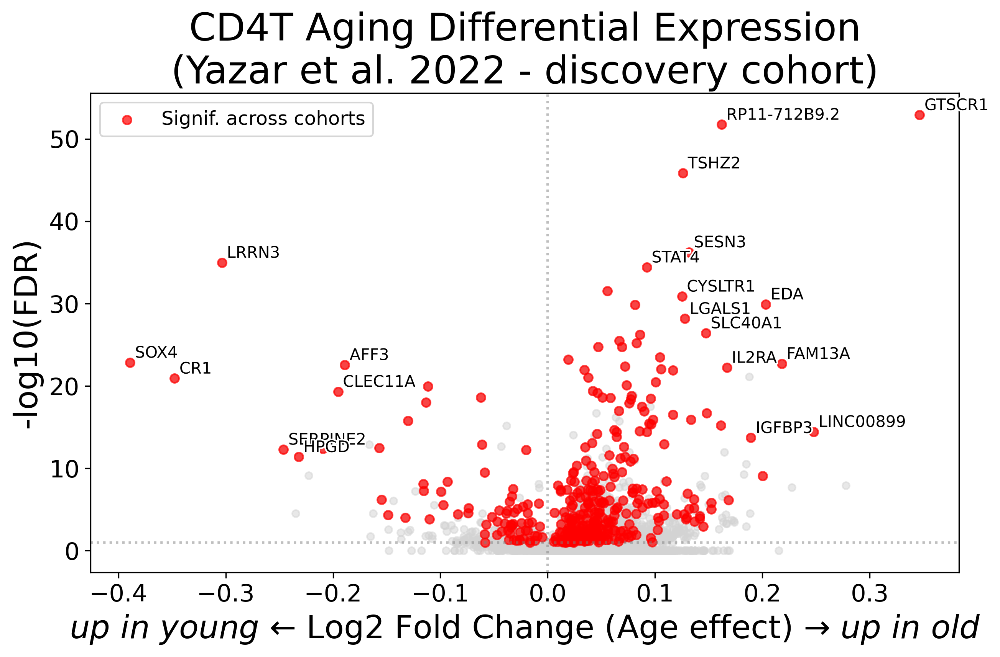

In [21]:
signif_thres = 1
test = train_results['CD4T'][train_results['CD4T'].adj_p_value<=signif_thres]

plt.figure(figsize=(9,6))

# Plot all points in grey
plt.scatter(test['log_fc'], -np.log10(test['adj_p_value']), 
           color='lightgrey', alpha=0.5, s=20, rasterized=False)

# Highlight points significant in both cohorts
test_both = pd.merge(test, val_results['CD4T'][['gene_name', 'adj_p_value', 'log_fc']], on='gene_name')
signif_both = (test_both['adj_p_value_x'] < 0.1) & (test_both['adj_p_value_y'] < 0.1)
plt.scatter(test_both.loc[signif_both, 'log_fc_x'], -np.log10(test_both.loc[signif_both, 'adj_p_value_x']),
           color='red', alpha=0.7, s=30, label='Signif. across cohorts', rasterized=False)

# Get top genes by total effect among genes significant in both datasets
n_top = 20
test_both['total_effect'] = -np.log10(test_both['adj_p_value_x']) * abs(test_both['log_fc_x'])
top_genes = test_both[signif_both].nlargest(n_top, 'total_effect')

# Annotate genes with adjust_text to avoid overlaps
texts = []
for _, gene in top_genes.iterrows():
    texts.append(plt.annotate(gene['gene_name'],
                xy=(gene['log_fc_x'], -np.log10(gene['adj_p_value_x'])),
                xytext=(3, 3),
                textcoords='offset points',
                fontsize=10,
                path_effects=[plt.matplotlib.patheffects.withStroke(linewidth=2, foreground='white')]))

# Add dotted lines at significance thresholds
plt.axhline(y=-np.log10(0.1), color='grey', linestyle=':', alpha=0.5)
plt.axvline(x=0, color='grey', linestyle=':', alpha=0.5)
# Add labels
plt.xlabel(r'$\it{up\ in\ young}$ ← Log2 Fold Change (Age effect) → $\it{up\ in\ old}$', fontsize=20)
plt.ylabel('-log10(FDR)', fontsize=20)
plt.title('CD4T Aging Differential Expression\n(Yazar et al. 2022 - discovery cohort)', fontsize=24)
plt.legend(fontsize=12)

plt.tight_layout()
plt.savefig('./results/Yazar2022_signature_volcano.pdf')
plt.savefig('./results/Yazar2022_signature_volcano.png')

In [19]:
test_both[(test_both['adj_p_value_y'] >= 0.1) & (test_both['adj_p_value_x'] < 0.1)].sort_values('zscore', ascending=False)[0:30]

,baseMean,log_fc_x,lfcSE,stat,pvalue,adj_p_value_x,variable,gene_name,perturbseq_gene,zscore,adj_p_value_y,log_fc_y,total_effect
1293,7.227166,0.187944,0.018459,10.181670,2.394180e-24,7.224437e-22,ENSG00000273445,RP11-1399P15.1,False,10.181670,0.579168,0.044564,3.973365
1481,10.767627,0.079456,0.008244,9.638209,5.514151e-22,1.259164e-19,ENSG00000163328,GPR155,True,9.638209,0.161534,0.038059,1.501714
3572,6.321909,0.095724,0.010312,9.282391,1.657170e-20,3.043789e-18,ENSG00000178199,ZC3H12D,True,9.282391,0.209361,0.044747,1.676750
1935,58.117605,0.045310,0.004997,9.067283,1.220215e-19,2.021489e-17,ENSG00000144746,ARL6IP5,True,9.067283,0.183203,0.020714,0.756425
6317,29.127534,0.063564,0.007112,8.937199,3.991577e-19,6.363176e-17,ENSG00000132965,ALOX5AP,True,8.937199,0.217127,0.030523,1.029509
6550,20.254670,0.066556,0.007552,8.813514,1.212834e-18,1.797760e-16,ENSG00000213928,IRF9,True,8.813514,0.571915,0.018454,1.047934
6974,4249.120041,0.023738,0.002847,8.339097,7.485988e-17,9.301340e-15,ENSG00000166710,B2M,True,8.339097,0.681352,0.005125,0.333084
8956,23.683397,0.043302,0.005196,8.333418,7.854102e-17,9.617290e-15,ENSG00000126456,IRF3,True,8.333418,0.256784,0.020799,0.606964
5606,32.490263,0.054640,0.006962,7.848424,4.212994e-15,4.394517e-13,ENSG00000023445,BIRC3,True,7.848424,0.805822,0.009148,0.675197
9271,6.919015,0.075890,0.009814,7.732542,1.054198e-14,1.060348e-12,ENSG00000124256,ZBP1,True,7.732542,0.375518,0.032150,0.908755


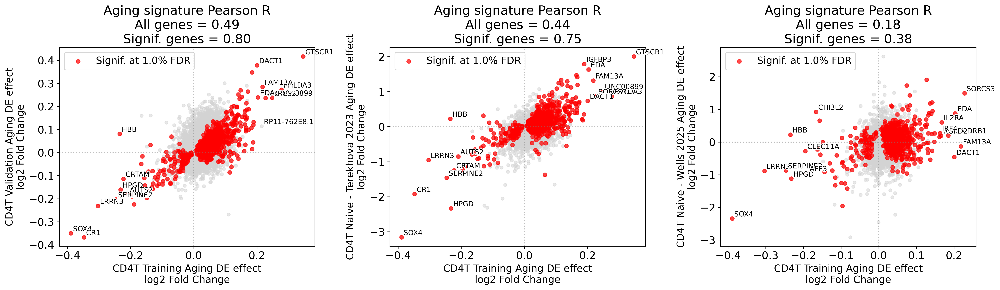

In [20]:
def plot_signature_comparison(train_results, val_results, 
                               x_label='Training Cohort', 
                               y_label='Validation Cohort', 
                               adj_p_alpha=0.01, 
                               n_top_genes=8,
                               figsize=(7,7),
                               output_prefix='./results/signature',
                               ax=None):
    """
    Plot a scatter comparison of log fold changes between two cohorts/datasets
    
    Parameters:
    -----------
    train_results : pd.DataFrame
        Results from training/discovery cohort with columns: gene_name, log_fc, adj_p_value
    val_results : pd.DataFrame
        Results from validation cohort with columns: gene_name, log_fc, adj_p_value
    x_label : str, optional
        Label for x-axis 
    y_label : str, optional
        Label for y-axis
    adj_p_alpha : float, optional
        Significance threshold for adjusted p-value
    n_top_genes : int, optional
        Number of top/bottom genes to annotate
    figsize : tuple, optional
        Size of the figure
    output_prefix : str, optional
        Prefix for output file names
    ax : matplotlib.axes.Axes, optional
        Axes to plot on. If None, creates a new figure
    """
    # Merge results on gene names
    test = pd.merge(train_results[['gene_name', 'log_fc', 'adj_p_value']],
                    val_results[['gene_name', 'log_fc', 'adj_p_value']],
                    left_on='gene_name',
                    right_on='gene_name')

    # Create figure and axes if not provided
    if ax is None:
        plt.figure(figsize=figsize)
        ax = plt.gca()

    # Plot all points in grey, rasterized
    ax.scatter(test['log_fc_x'], test['log_fc_y'], color='lightgrey', alpha=0.5, s=20, rasterized=True)

    # Add points significant in both datasets with same direction, rasterized
    signif = (test['adj_p_value_x'] < adj_p_alpha) 
    ax.scatter(test.loc[signif, 'log_fc_x'], 
               test.loc[signif, 'log_fc_y'],
               color='red', alpha=0.7, s=30, 
               label=f'Signif. at {adj_p_alpha*100}% FDR', 
               rasterized=True)

    # Get top/bottom genes by log_fc
    test['total_log_fc'] = test['log_fc_x'] 
    top_genes = test.nlargest(n_top_genes, 'total_log_fc')
    bottom_genes = test.nsmallest(n_top_genes, 'total_log_fc')

    # Annotate these genes with adjust_text to avoid overlaps
    texts = []
    for _, gene in pd.concat([top_genes, bottom_genes]).iterrows():
        texts.append(ax.annotate(gene['gene_name'],
                    xy=(gene['log_fc_x'], gene['log_fc_y']),
                    xytext=(3, 3),
                    textcoords='offset points',
                    fontsize=10,
                    path_effects=[plt.matplotlib.patheffects.withStroke(linewidth=2, foreground='white')]))

    # Add dotted lines at x=0 and y=0
    ax.axhline(y=0, color='grey', linestyle=':', alpha=0.5)
    ax.axvline(x=0, color='grey', linestyle=':', alpha=0.5)

    # Add labels
    ax.set_xlabel(f'{x_label} Aging DE effect\nlog2 Fold Change', fontsize=14)
    ax.set_ylabel(f'{y_label} Aging DE effect\nlog2 Fold Change', fontsize=14)
    ax.legend(fontsize=14)

    # Calculate correlation for only significant genes in main dataset
    corr_all, _ = pearsonr(test['log_fc_x'], 
                          test['log_fc_y'])

    signif = (test['adj_p_value_x'] < adj_p_alpha) 
    corr, pval = pearsonr(test.loc[signif, 'log_fc_x'], 
                          test.loc[signif, 'log_fc_y'])
    ax.set_title(f'Aging signature Pearson R\nAll genes = {corr_all:.2f}\nSignif. genes = {corr:.2f}')

    # Save figure if not using a pre-existing axes
    if ax is plt.gca():
        plt.tight_layout()
        plt.savefig(f'{output_prefix}.pdf')
        plt.savefig(f'{output_prefix}.png')
    
    return test, corr, pval

# Example usage with 3 subplots
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 6))

# Within Yazar
test_cd4t, corr_cd4t, pval_cd4t = plot_signature_comparison(
    train_results['CD4T'], 
    val_results['CD4T'], 
    x_label='CD4T Training', 
    y_label='CD4T Validation', 
    output_prefix='./results/Yazar2022_signature_CD4T',
    ax=ax1
)

# vs Te Yazar
test_cd4t, corr_cd4t, pval_cd4t = plot_signature_comparison(
    train_results['CD4T'], 
    Tere2023_naive_lfc, 
    x_label='CD4T Training', 
    y_label='CD4T Naive - Terekhova 2023', 
    output_prefix='./results/Yazar2022_signature_CD4T',
    ax=ax2
)

test_cd4t, corr_cd4t, pval_cd4t = plot_signature_comparison(
    train_results['CD4T'], 
    Wells2025_naive_lfc, 
    x_label='CD4T Training', 
    y_label='CD4T Naive - Wells 2025', 
    output_prefix='./results/Yazar2022_signature_CD4T',
    ax=ax3
)
plt.tight_layout()
plt.savefig('./results/signature_comparisons_scatter.pdf')
plt.savefig('./results/signature_comparisons_scatter.png')

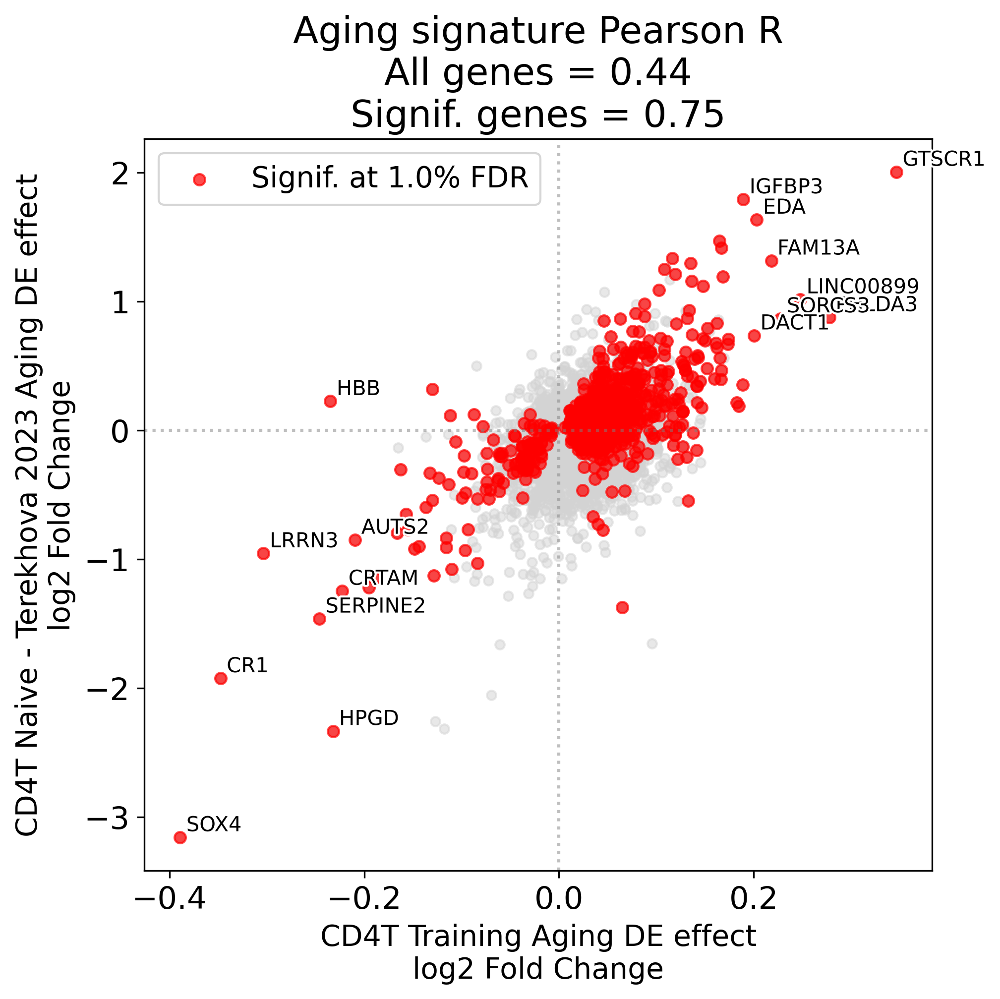

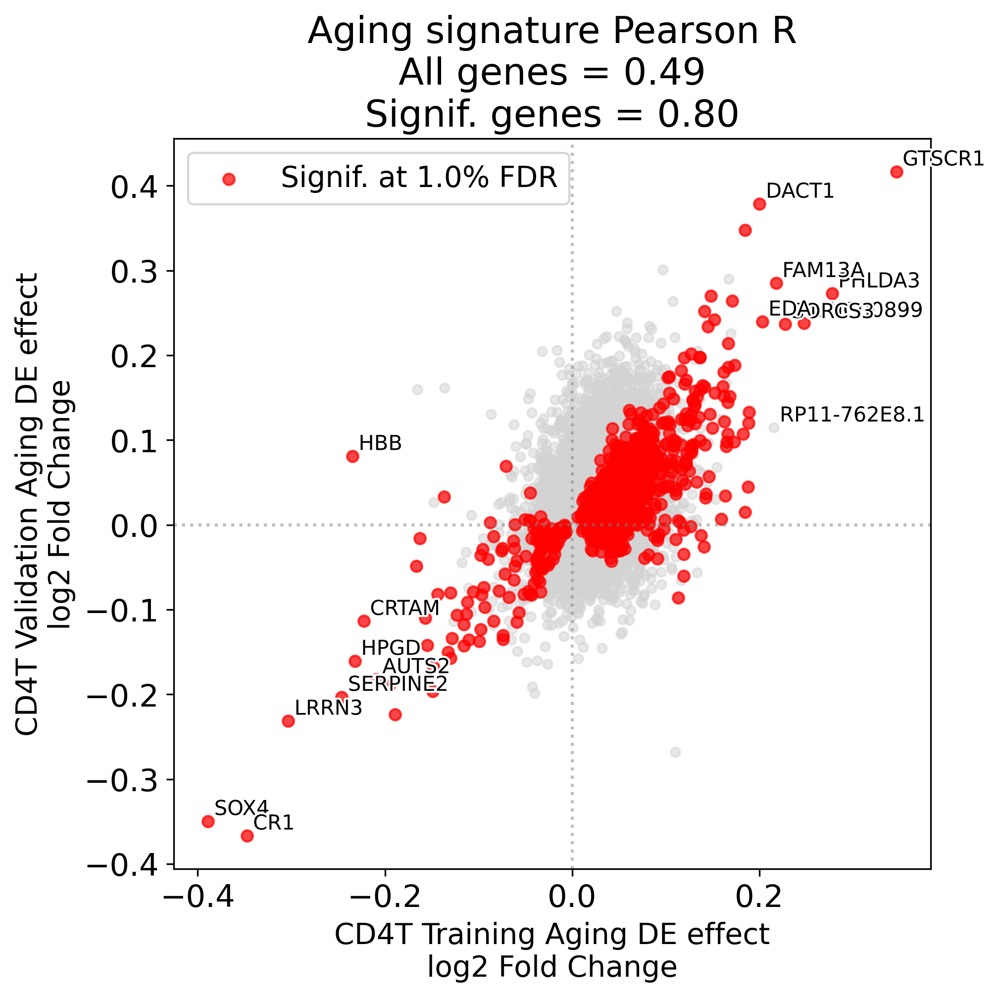

In [21]:
test_cd4t, corr_cd4t, pval_cd4t = plot_signature_comparison(
    train_results['CD4T'], 
    Tere2023_naive_lfc, 
    x_label='CD4T Training', 
    y_label='CD4T Naive - Terekhova 2023'
    # output_prefix='./results/Yazar2022_signature_CD4T',
    # ax=ax2
)

test_cd4t, corr_cd4t, pval_cd4t = plot_signature_comparison(
    train_results['CD4T'], 
    val_results['CD4T'], 
    x_label='CD4T Training', 
    y_label='CD4T Validation', 
    # output_prefix='./results/Yazar2022_signature_CD4T',
    # ax=ax1
)

In [22]:
pl_genes = [
    'TCF7',
 'CHI3L2',
 'LYAR',
 'FCMR',
 'SH2D1A',
 'KLF3',
 'GYPC',
 'AAK1',
 'BCL7A',
 'LAT',
 'PIM1',
 'VIM',
 'MBNL1',
 'SMARCA2',
 'BCL2',
 'CDK6',
 'SPG11',
 'PGAP1',
 'BHLHE40',
 'ARID5B',
 'PIM2',
 'IL2RB',
 'DPP4',
 'CBFB',
 'SERPINB6',
 'KMT2A',
 'SESN3'
 ]

test_cd4t[test_cd4t.gene_name.isin(pl_genes)].sort_values('adj_p_value_y')

,gene_name,log_fc_x,adj_p_value_x,log_fc_y,adj_p_value_y,total_log_fc
8406,BCL2,0.086001,6.131414e-27,0.130336,1.896340e-16,0.086001
3317,PIM1,0.077525,4.163556e-19,0.114853,4.651575e-11,0.077525
5597,SESN3,0.131596,5.574596e-37,0.142128,1.668412e-10,0.131596
2120,MBNL1,0.041847,3.800507e-20,0.046279,5.903806e-07,0.041847
2280,LYAR,-0.045073,1.260609e-05,-0.082068,1.144959e-04,-0.045073
7540,CBFB,0.067770,6.377686e-12,0.081525,4.055904e-04,0.067770
876,FCMR,-0.028240,8.263116e-06,-0.045812,7.975055e-04,-0.028240
2336,KLF3,-0.024496,4.462347e-04,-0.044569,9.186516e-04,-0.024496
5001,ARID5B,0.064289,1.573503e-14,0.060251,2.453056e-03,0.064289
3866,CDK6,0.064204,7.571882e-06,0.082440,4.271713e-03,0.064204


/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/anndata/_core/anndata.py:850: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    ['RP11-34P13.7', 'RP11-34P13.13', 'LINC01409', 'LINC01128', 'LINC00115']

    Inferred to be: categorical

  names = self._prep_dim_index(names, "var")


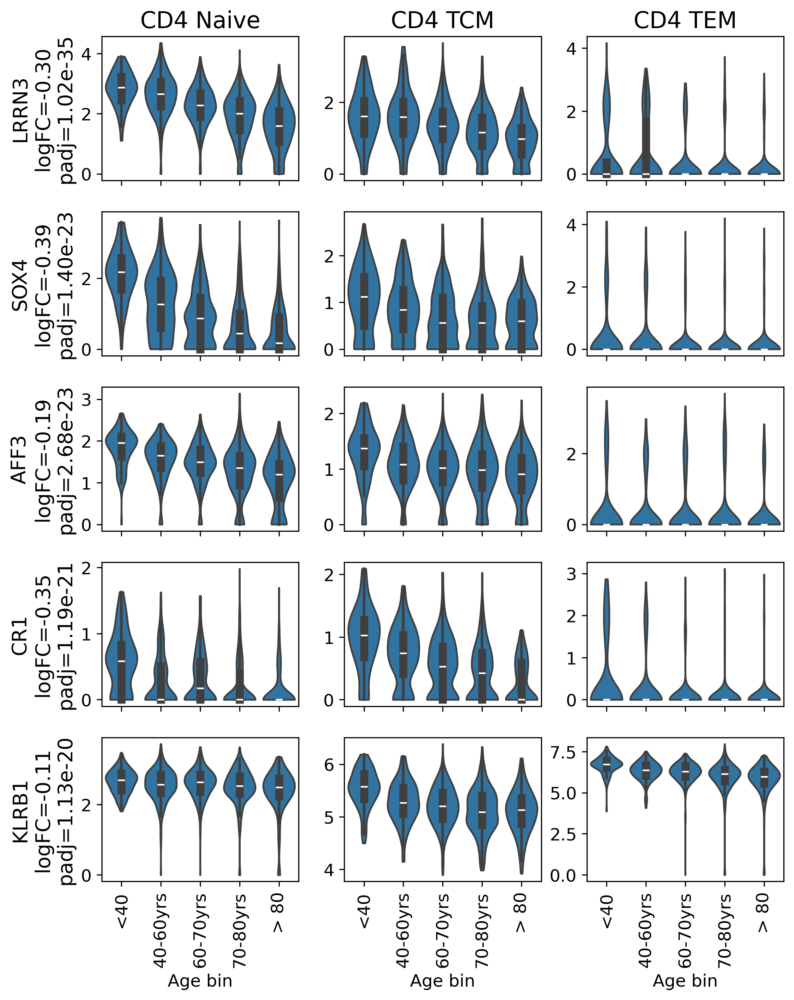

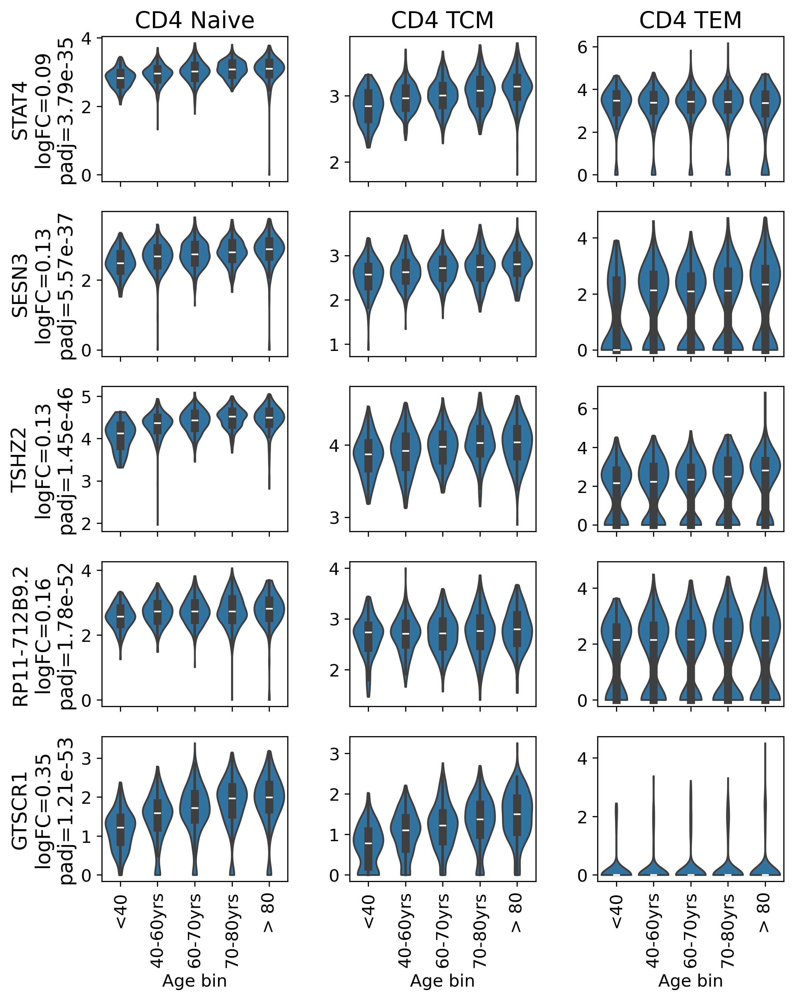

In [22]:
pbulk_adata = sc.read_h5ad(datadir + "Yazar2022_CD4T_processed.pbulk.h5ad")
pbulk_adata.obs_names_make_unique()
pbulk_adata.var['ensembl_id'] = pbulk_adata.var.index
pbulk_adata.var_names = pbulk_adata.var['feature_name']

# Create mapping dictionary for age categories
age_cat_map = {
    1: '<40',
    2: '40-60yrs', 
    3: '60-70yrs',
    4: '70-80yrs',
    5: '> 80'
}

pbulk_adata.obs['age_cat'] = pbulk_adata.obs['age_cat'].map(age_cat_map)

# Get top 5 and bottom 5 genes by absolute zscore for significantly differentially expressed genes
top_bottom_genes = pd.concat([
    train_results['CD4T'][train_results['CD4T'].adj_p_value < 0.01].sort_values("zscore").head(5),
    train_results['CD4T'][train_results['CD4T'].adj_p_value < 0.01].sort_values("zscore").tail(5)
])

gs_down = ['SOX4','CR1','LRRN3','KLRB1']
gene_sets = {
    'up': train_results['CD4T'][train_results['CD4T'].adj_p_value < 0.01].sort_values("zscore").head(5)['gene_name'],
    'down': train_results['CD4T'][train_results['CD4T'].adj_p_value < 0.01].sort_values("zscore").tail(5)['gene_name']
}


celltypes = pbulk_adata.obs['predicted.celltype.l2'].unique()

for gs_name, gs in gene_sets.items():
    fig, axes = plt.subplots(len(gs), len(celltypes), figsize=(8, 10), sharex=True)

    for i, g in enumerate(gs):
        gex_df = sc.get.obs_df(pbulk_adata, [g, 'age_cat', 'predicted.celltype.l2'], layer='log1p_norm')
        age_order = ['<40', '40-60yrs', '60-70yrs', '70-80yrs', '> 80']
        
        for j, ct in enumerate(celltypes):
            ct_data = gex_df[gex_df['predicted.celltype.l2'] == ct]
            sns.violinplot(data=ct_data, x='age_cat', y=g, ax=axes[i,j],
                        order=age_order, cut=0, scale='width')
            
            axes[i,j].tick_params(axis='x', rotation=90, labelsize=12)
            axes[i,j].tick_params(axis='y', labelsize=12)
            
            # Only show y-label on leftmost plots
            if j == 0:
                DE_lfc = res_df[res_df['gene_name'] == g]['log_fc'].iloc[0]
                DE_padj = res_df[res_df['gene_name'] == g]['adj_p_value'].iloc[0]
                axes[i,j].set_ylabel(f"{g}\nlogFC={DE_lfc:.2f}\npadj={DE_padj:.2e}", fontsize=14)
            else:
                axes[i,j].set_ylabel('')
                
            # Only show x-label on bottom plots
            if i == len(gs)-1:
                axes[i,j].set_xlabel('Age bin', fontsize=12)
            else:
                axes[i,j].set_xlabel('')
                
            # Show celltype as title only on top row
            if i == 0:
                axes[i,j].set_title(ct, fontsize=16)

    plt.tight_layout()
    
    plt.savefig(f'./results/Yazar2022_aging_violinplots_{gs_name}.pdf')
    plt.savefig(f'./results/Yazar2022_aging_violinplots_{gs_name}.png')

/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/anndata/_core/anndata.py:850: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    ['RP11-34P13.7', 'RP11-34P13.13', 'LINC01409', 'LINC01128', 'LINC00115']

    Inferred to be: categorical

  names = self._prep_dim_index(names, "var")
/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/scanpy/plotting/_baseplot_class.py:874: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(filename, bbox_inches=bbox_inches, **kwargs)
/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/scanpy/plotting/_baseplot_class.py:874: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(filename, bbox_inches=bbox_inches, **kwargs)
/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/scanpy/plotting/_bas

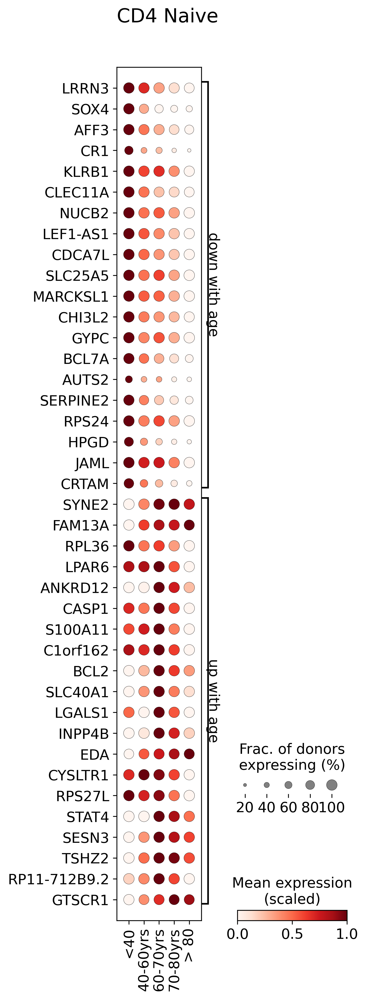

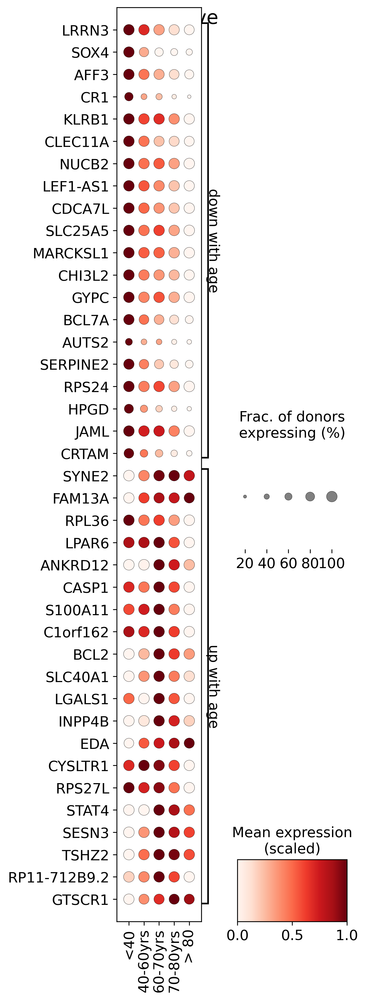

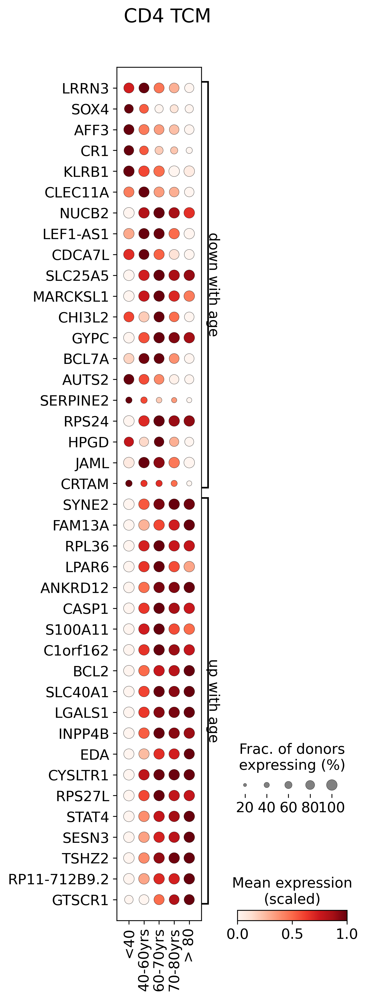

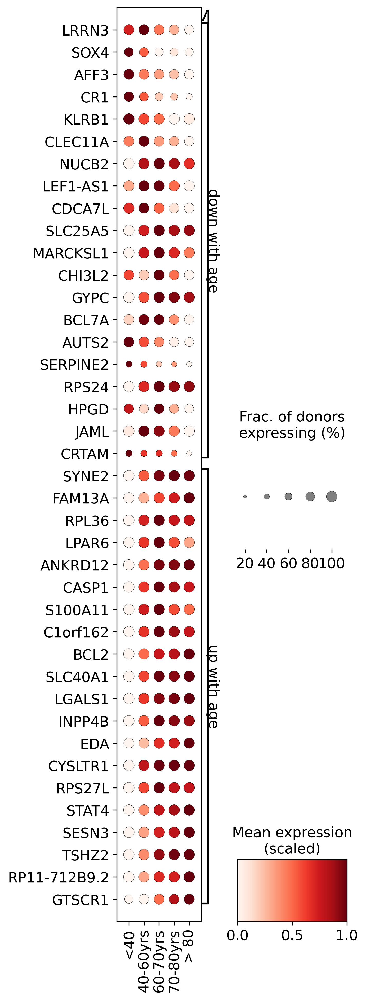

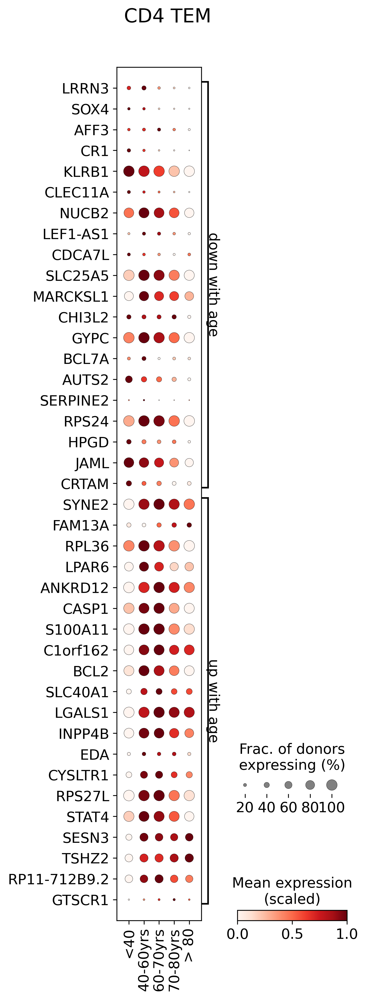

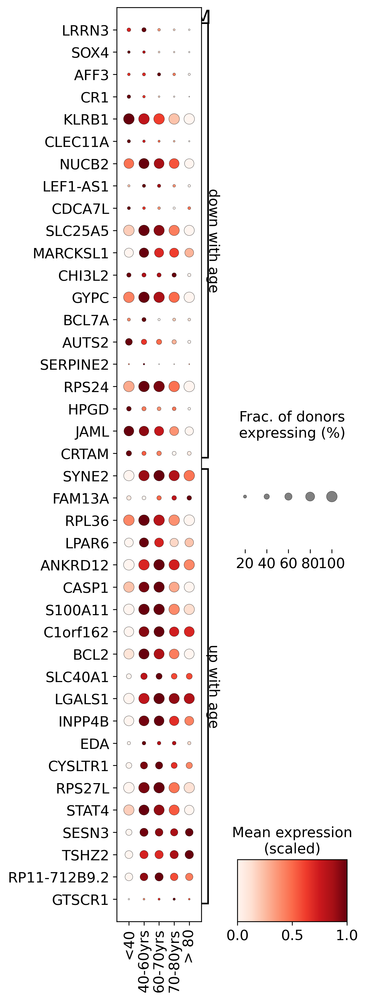

In [ ]:
# Get top 5 and bottom 5 genes by absolute zscore for significantly differentially expressed genes
gene_sets = {
    'down with age': train_results['CD4T'][train_results['CD4T'].adj_p_value < 0.01].sort_values("zscore").head(20)['gene_name'],
    'up with age': train_results['CD4T'][train_results['CD4T'].adj_p_value < 0.01].sort_values("zscore").tail(20)['gene_name']
}

pbulk_adata = sc.read_h5ad(datadir + "Yazar2022_CD4T_processed.pbulk.h5ad")
pbulk_adata.obs_names_make_unique()
pbulk_adata.var['ensembl_id'] = pbulk_adata.var.index
pbulk_adata.var_names = pbulk_adata.var['feature_name']
age_cat_map = {
    1: '<40',
    2: '40-60yrs', 
    3: '60-70yrs',
    4: '70-80yrs',
    5: '> 80'
}
age_order = ['<40', '40-60yrs', '60-70yrs', '70-80yrs', '> 80']
pbulk_adata.obs['age_cat'] = pd.Categorical(pbulk_adata.obs['age_cat'].map(age_cat_map), categories=age_order)

for ct in pbulk_adata.obs['predicted.celltype.l2'].unique():
    pl = sc.pl.DotPlot(pbulk_adata[pbulk_adata.obs['predicted.celltype.l2'] == ct], gene_sets, groupby='age_cat', standard_scale='var', title=ct) \
    .swap_axes() \
    .style(smallest_dot = 0, largest_dot = 100) \
    .legend(size_title = 'Frac. of donors\nexpressing (%)', colorbar_title = 'Mean expression\n(scaled)', width=2)
    pl.savefig(f'./results/Yazar2022_dotplot_{ct}.pdf', bbox_inches='tight')
    pl.savefig(f'./results/Yazar2022_dotplot_{ct}.png', bbox_inches='tight')

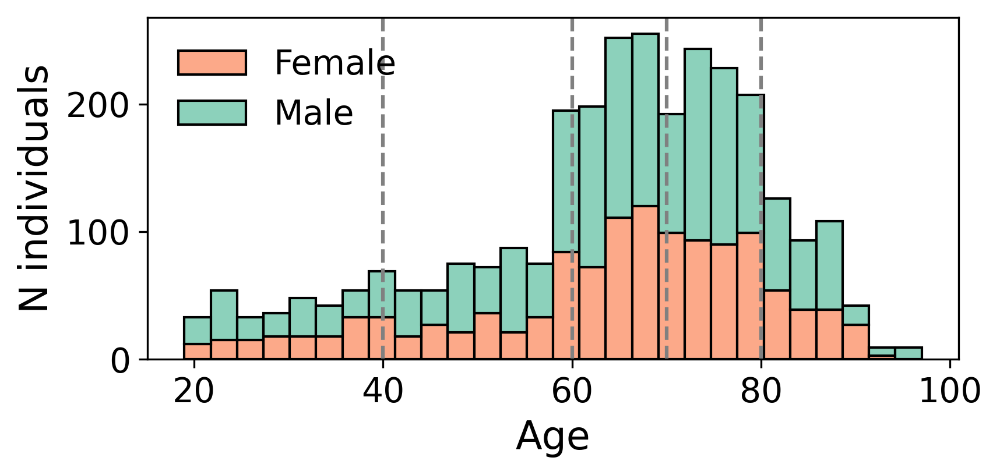

In [22]:
plt.figure(figsize=(6,3))
sns.histplot(data=pbulk_adata.obs, x='age', hue='male', multiple='stack', palette='Set2', legend=True)
plt.legend(title='', labels=['Female', 'Male'], frameon=False, fontsize=14)
plt.xlabel('Age', fontsize=16)
plt.ylabel('N individuals', fontsize=16)
for x in [40,60,70,80]:
    plt.axvline(x, linestyle='--', color='grey')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.tight_layout()
plt.savefig(f'./results/Yazar2022_demographics.pdf')
plt.savefig(f'./results/Yazar2022_demographics.png')


/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/anndata/_core/anndata.py:850: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    ['RP11-34P13.7', 'RP11-34P13.13', 'LINC01409', 'LINC01128', 'LINC00115']

    Inferred to be: categorical

  names = self._prep_dim_index(names, "var")
/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


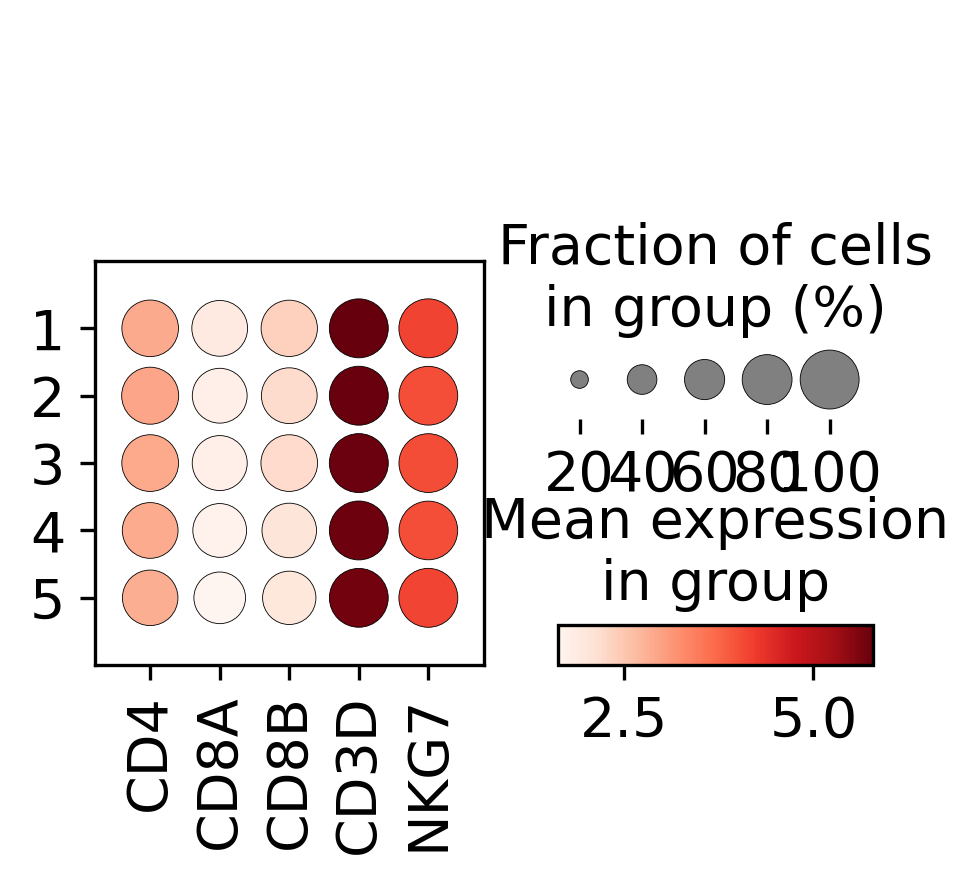

In [23]:
ct = 'CD4T'
pbulk_adata = sc.read_h5ad(datadir + f"Yazar2022_{ct}_processed.pbulk.h5ad")
pbulk_adata.var_names = pbulk_adata.var['feature_name']
pbulk_adata.obs['age_cat'] = pbulk_adata.obs['age_cat'].astype(str)
sc.pl.dotplot(pbulk_adata, ['CD4', 'CD8A', 'CD8B', 'CD3D', 'NKG7'], groupby='age_cat', layer='log1p_norm')

### Gene set enrichment analysis

In [24]:
import gseapy as gp
from gseapy import Msigdb
from gseapy import barplot, dotplot

msig = Msigdb()
kegg_gene_sets = msig.get_gmt(category= 'c2.cp.kegg_legacy', dbver="2025.1.Hs")
reactome_gene_sets = msig.get_gmt(category= 'c2.cp.reactome', dbver="2025.1.Hs")
hallmark_gene_sets = msig.get_gmt(category= 'h.all', dbver="2025.1.Hs")

In [25]:
res_df = train_results['CD4T'].copy()
aging_down = res_df[(res_df['adj_p_value'] < 0.01) & (res_df.log_fc < 0)]['gene_name'].tolist()
# aging_down = list(np.intersect1d(aging_down, signif_consistent))
aging_up = res_df[(res_df['adj_p_value'] < 0.01) & (res_df.log_fc > 0)]['gene_name'].tolist()
# aging_up = list(np.intersect1d(aging_up, signif_consistent))
aging_all = res_df['gene_name'].tolist()

In [26]:
enr = gp.enrichr(gene_list=aging_up, # or "./tests/data/gene_list.txt",
                 gene_sets={**hallmark_gene_sets},
                 organism='human', # don't forget to set organism to the one you desired! e.g. Yeast
                 outdir=None, # don't write to disk
                 background=aging_all
                )
enrichr_results_aging_up = enr.results.sort_values('Adjusted P-value')

enr = gp.enrichr(gene_list=aging_down, # or "./tests/data/gene_list.txt",
                 gene_sets={**hallmark_gene_sets},
                 organism='human', # don't forget to set organism to the one you desired! e.g. Yeast
                 outdir=None, # don't write to disk
                 background=aging_all
                )
enrichr_results_aging_down = enr.results.sort_values('Adjusted P-value')


In [27]:
enrichr_results_aging_up[enrichr_results_aging_up['Adjusted P-value'] < 0.1]

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes
22,gs_ind_0,HALLMARK_IL2_STAT5_SIGNALING,37/118,2.960402e-12,1.420993e-10,4.892900,129.885431,GBP4;TRAF1;DHRS3;TNFSF10;IL2RA;CTLA4;IRF4;NDRG...
26,gs_ind_0,HALLMARK_INTERFERON_GAMMA_RESPONSE,34/128,3.141850e-09,7.540440e-08,3.862989,75.631359,GBP4;TAP1;TXNIP;CASP8;HLA-DRB1;TNFSF10;IRF4;ST...
35,gs_ind_0,HALLMARK_P53_PATHWAY,25/105,3.443033e-06,5.508854e-05,3.321950,41.787337,PHLDA3;TAP1;TXNIP;NDRG1;BTG1;CDKN2A;RPL36;RPS2...
25,gs_ind_0,HALLMARK_INTERFERON_ALPHA_RESPONSE,18/66,1.088534e-05,1.306240e-04,3.981987,45.506521,OAS1;GBP4;TAP1;MX1;LPAR6;PARP9;TXNIP;GBP2;CASP...
1,gs_ind_0,HALLMARK_ALLOGRAFT_REJECTION,26/121,1.618330e-05,1.553597e-04,2.908534,32.085578,PRF1;TAP1;TRAT1;IL2RA;IRF4;STAT4;B2M;CAPG;CDKN...
21,gs_ind_0,HALLMARK_HYPOXIA,21/91,3.407404e-05,2.725923e-04,3.186888,32.783439,ANXA2;IGFBP3;ERO1A;TGFBI;RBPJ;NR3C1;NDRG1;PNRC...
6,gs_ind_0,HALLMARK_APOPTOSIS,22/100,4.890418e-05,3.353430e-04,2.996044,29.737672,PRF1;TAP1;TXNIP;RNASEL;CASP8;ANXA1;TNFSF10;MCL...
11,gs_ind_0,HALLMARK_DNA_REPAIR,13/61,2.256970e-03,1.203718e-02,2.889141,17.605653,ARL6IP1;COX17;DDB2;PDE4B;RBX1;EIF1B;AK1;POLH;A...
24,gs_ind_0,HALLMARK_INFLAMMATORY_RESPONSE,17/90,2.099132e-03,1.203718e-02,2.475834,15.266568,TNFRSF1B;EMP3;CD70;RGS16;ACVR2A;TIMP1;TNFSF10;...
13,gs_ind_0,HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION,14/70,2.916178e-03,1.399766e-02,2.664467,15.553779,GLIPR1;EMP3;TIMP1;IGFBP3;IL32;FLNA;NOTCH2;TGFB...


In [28]:
val_results['CD4T'][val_results['CD4T'].gene_name.isin(['GYPC', 'YPEL5', 'HBB', 'TFDP2', 'RBM38'])]

,baseMean,log_fc,lfcSE,stat,pvalue,adj_p_value,variable,gene_name,perturbseq_gene,zscore
ENSG00000119801,28.848832,-0.001071,0.013335,-0.080323,0.935980,0.982085,ENSG00000119801,YPEL5,True,-0.080323
ENSG00000136732,66.901119,-0.016058,0.009901,-1.621885,0.104828,0.430325,ENSG00000136732,GYPC,True,-1.621885
ENSG00000114126,5.868595,-0.037748,0.017467,-2.161110,0.030687,0.218522,ENSG00000114126,TFDP2,True,-2.161110
ENSG00000244734,6.142415,0.080880,0.085489,0.946084,0.344106,0.710201,ENSG00000244734,HBB,False,0.946084
ENSG00000132819,7.355497,-0.043392,0.018288,-2.372694,0.017659,0.160205,ENSG00000132819,RBM38,True,-2.372694


In [34]:
enrichr_results_aging_down[enrichr_results_aging_down['Adjusted P-value'] < 0.1]

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes
3,gs_ind_0,HALLMARK_APICAL_JUNCTION,5/78,0.002871,0.076594,6.087306,35.628970,FYB1;SKAP2;CNN2;ACTN1;PECAM1
14,gs_ind_0,HALLMARK_HEME_METABOLISM,5/86,0.004377,0.076594,5.485299,29.793045,HBB;RBM38;KLF3;EPB41;GYPC


In [30]:
mtor_sets = ['HALLMARK_PI3K_AKT_MTOR_SIGNALING', 'HALLMARK_MTORC1_SIGNALING']
enrichr_results_aging_up[enrichr_results_aging_up['Term'].isin(mtor_sets)]

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes
30,gs_ind_0,HALLMARK_MTORC1_SIGNALING,16/98,0.011881,0.040735,2.075244,9.199142,DDIT4;XBP1;FGL2;GAPDH;BHLHE40;SLA;IFI30;ERO1A;...
38,gs_ind_0,HALLMARK_PI3K_AKT_MTOR_SIGNALING,9/62,0.094488,0.197193,1.833677,4.326152,TIAM1;CAB39;SLA;ACTR3;IRAK4;CDKN1B;DAPP1;CALR;...


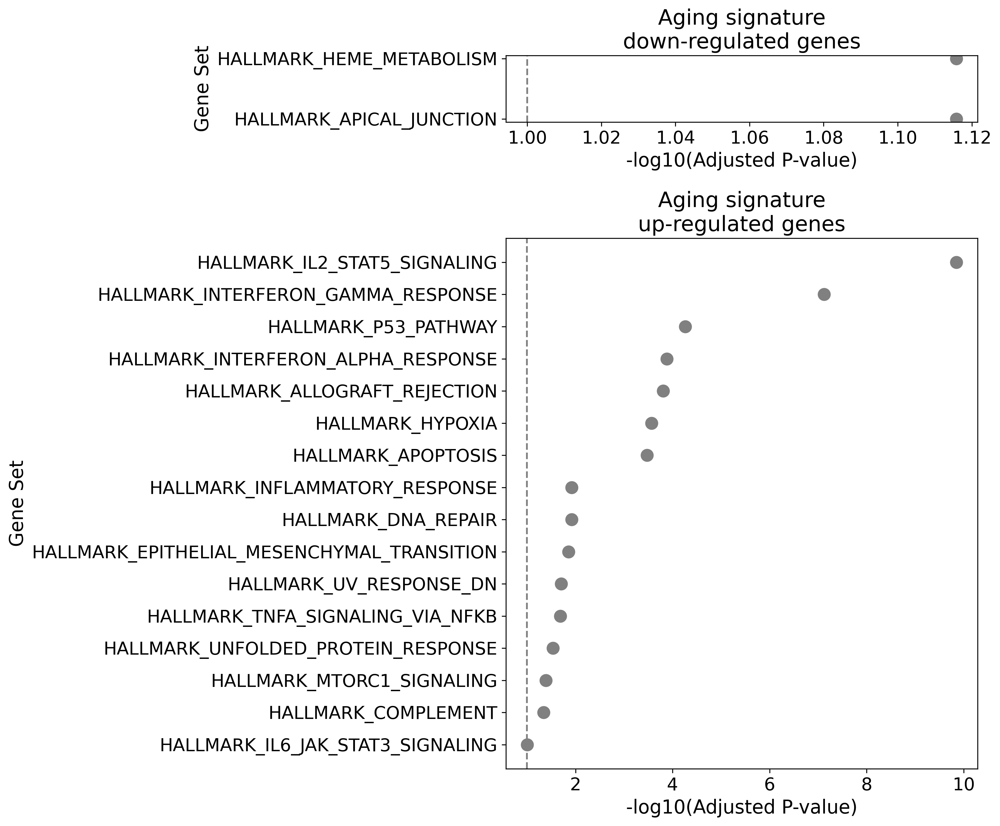

In [32]:
mtor_sets = ['HALLMARK_PI3K_AKT_MTOR_SIGNALING', 'HALLMARK_MTORC1_SIGNALING']

# List of enrichment results and naming
enrichr_named = [
    ('down-regulated genes', enrichr_results_aging_down),
    ('up-regulated genes', enrichr_results_aging_up)
]

# Extract number of terms passing threshold for each group
n_terms = [
    (df['Adjusted P-value'] < 0.1).sum()
    for _, df in enrichr_named
]

# Fix for at least one term to avoid 0 height
n_terms = [max(1, n) for n in n_terms]

# Proportional heights (sum to total, default=5 per axis unit for readability)
# Optionally, could set min/max heights, but keep proportional
total_height_units = sum(n_terms)
relative_heights = [n / total_height_units for n in n_terms]
total_fig_height = 10  # Total figure height in inches
fig_heights = [total_fig_height * rh for rh in relative_heights]

# Matplotlib requires gridspec_kw for variable heights in subplots
fig, axes = plt.subplots(
    nrows=2, ncols=1,
    figsize=(12, total_fig_height),
    gridspec_kw={'height_ratios': fig_heights}
)

for (name, df), ax in zip(enrichr_named, axes):
    # Select the terms and sort
    df_sorted = df[df['Adjusted P-value'] < 0.1].sort_values('Adjusted P-value', ascending=False)

    # Plot
    ax.scatter(
        -np.log10(df_sorted['Adjusted P-value']),
        df_sorted['Term'],
        color='grey',
        marker='o', s=100,
    )

    ax.axvline(1, color='grey', linestyle='--')
    ax.set_xlabel('-log10(Adjusted P-value)')
    ax.set_ylabel('Gene Set')
    ax.set_title(f'Aging signature\n{name}')

plt.tight_layout()
plt.savefig(f'./results/Yazar2022_enrichment_analysis.pdf')
plt.savefig(f'./results/Yazar2022_enrichment_analysis.png')



## Plot Yazar UMAP for illustration

In [37]:
sc._settings.settings._vector_friendly=True
adata_umap = anndata.experimental.read_lazy('/mnt/oak/users/emma/data/cxg_datasets/Yazar2022.h5ad')

In [38]:
adata_umap.obsm['X_azimuth_umap'] = adata_umap.obsm['X_azimuth_umap'].compute()
adata_umap.obsm['X_umap'] = adata_umap.obsm['X_umap'].compute()

In [39]:
adata_umap.obs = adata_umap.obs.to_dataframe()

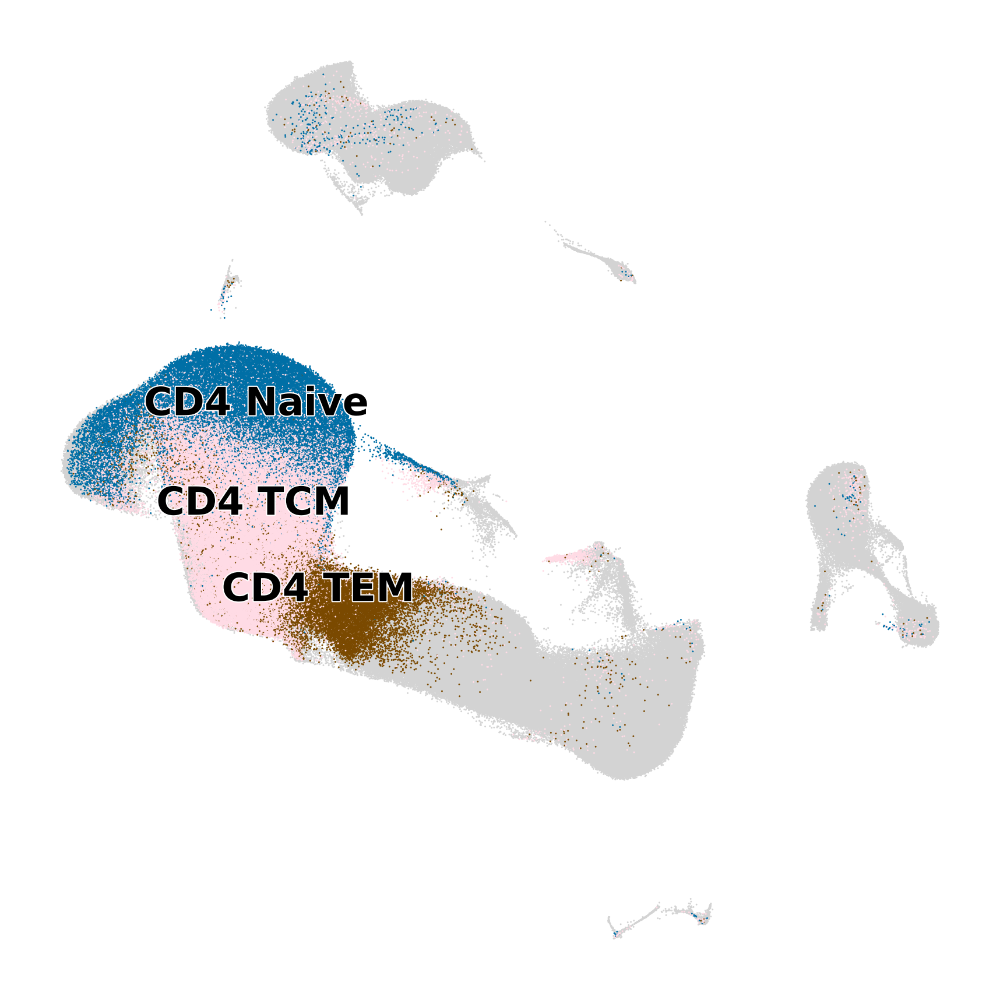

In [40]:
fig, ax = plt.subplots(1,1, figsize=(6,6))
sc.pl.umap(
    adata_umap,
    color='predicted.celltype.l2',
    groups=['CD4 TCM', 'CD4 Naive', 'CD4 TEM'],
    legend_loc='on data',
    frameon=False,
    legend_fontoutline = True,
    na_in_legend=False,
    title='',
    size=2,
    ax = ax
)
fig.savefig('results/Yazar2022_umap.pdf')

In [41]:
adata_umap.uns.keys()

dict_keys(['cell_type_ontology_term_id_colors', 'default_embedding', 'schema_version', 'title', 'predicted.celltype.l2_colors'])

## Save supplementary table

In [36]:
pd.read_csv('../../metadata/suppl_tables/Th2_Th1_polarization_signature_DE_results_full.suppl_table.csv').head()

,variable,baseMean,log_fc,lfcSE,stat,p_value,adj_p_value,contrast,zscore
0,TMEM62,155.340971,-2.032439,0.053194,-38.207854,0.000000e+00,0.000000e+00,Th2_vs_Th1 (Ota 2021),-38.207854
1,STOM,1518.826775,-3.762299,0.073999,-50.842774,0.000000e+00,0.000000e+00,Th2_vs_Th1 (Ota 2021),-50.842774
2,TIAM1,1241.828779,1.968600,0.051735,38.051957,0.000000e+00,0.000000e+00,Th2_vs_Th1 (Ota 2021),38.051957
3,LYAR,416.145758,-2.605521,0.056090,-46.452303,0.000000e+00,0.000000e+00,Th2_vs_Th1 (Ota 2021),-46.452303
4,GBP5,2429.952610,-2.782548,0.074650,-37.274396,4.266397e-304,1.747460e-300,Th2_vs_Th1 (Ota 2021),-37.274396


In [ ]:
df = train_results['CD4T'].copy()
df['contrast'] = 'age_bin (Yaza2022 Discovery)'
df = df.rename({'pvalue':'p_value'}, axis=1)
df = df[['variable', 'gene_name', 'baseMean', 'log_fc', 'lfcSE', 'stat', 'p_value', 'adj_p_value', 'contrast', 'zscore']]
df = df.reset_index(drop=True)

df2 = val_results['CD4T'].copy()
df2['contrast'] = 'age_bin (Yaza2022 Replication)'
df2 = df2.rename({'pvalue':'p_value'}, axis=1)
df2 = df2[['variable', 'gene_name', 'baseMean', 'log_fc', 'lfcSE', 'stat', 'p_value', 'adj_p_value', 'contrast', 'zscore']]
df2 = df2.reset_index(drop=True)

pd.concat([df, df2]).to_csv('../../metadata/suppl_tables/CD4T_aging_signature_DE_results_full.suppl_table.csv')

,variable,gene_name,baseMean,log_fc,lfcSE,stat,p_value,adj_p_value,contrast,zscore
ENSG00000241860,ENSG00000241860,RP11-34P13.13,0.123937,0.149389,0.111801,1.336197,0.181485,1.000000,age_bin (Yaza2022 Discovery),1.336197
ENSG00000237491,ENSG00000237491,LINC01409,1.914465,0.021603,0.032232,0.670222,0.502717,0.810252,age_bin (Yaza2022 Discovery),0.670222
ENSG00000225880,ENSG00000225880,LINC00115,0.514506,0.145404,0.061820,2.352052,0.018670,0.165869,age_bin (Yaza2022 Discovery),2.352052
ENSG00000187583,ENSG00000187583,PLEKHN1,0.460433,0.128508,0.070854,1.813688,0.069726,0.349348,age_bin (Yaza2022 Discovery),1.813688
ENSG00000188290,ENSG00000188290,HES4,0.378030,0.010603,0.069132,0.153373,0.878104,1.000000,age_bin (Yaza2022 Discovery),0.153373


/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/anndata/_core/anndata.py:850: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    ['RP11-34P13.7', 'RP11-34P13.13', 'LINC01409', 'LINC01128', 'LINC00115']

    Inferred to be: categorical

  names = self._prep_dim_index(names, "var")
/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/scanpy/plotting/_baseplot_class.py:874: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(filename, bbox_inches=bbox_inches, **kwargs)
/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/scanpy/plotting/_baseplot_class.py:874: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(filename, bbox_inches=bbox_inches, **kwargs)
/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/scanpy/plotting/_bas

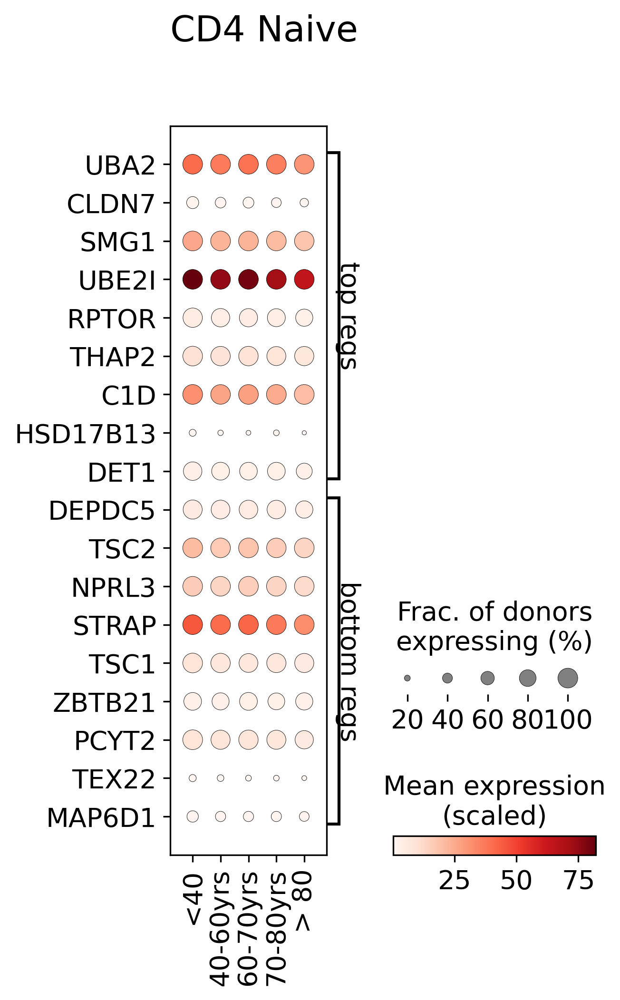

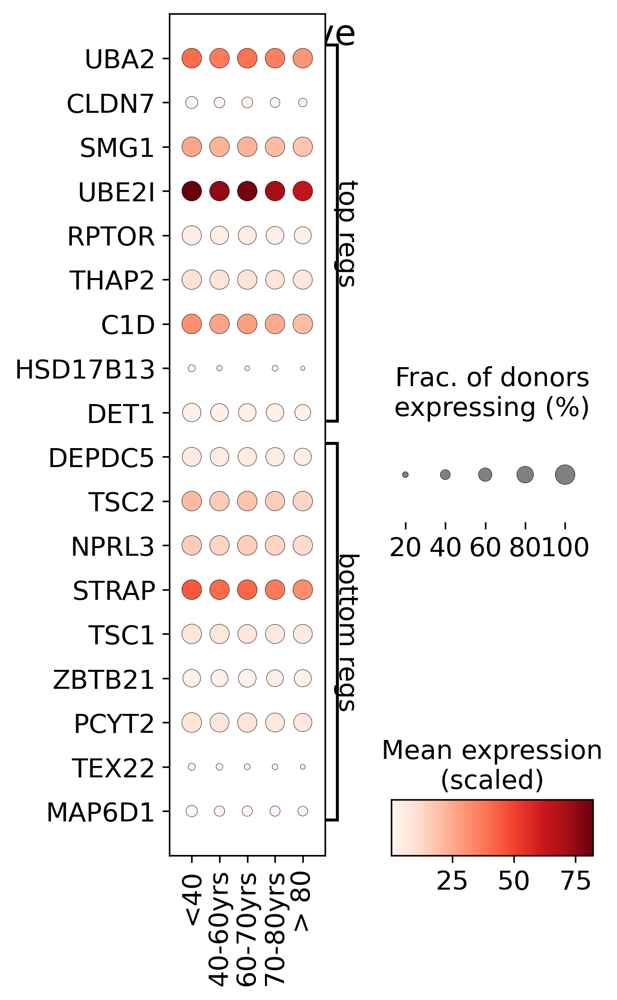

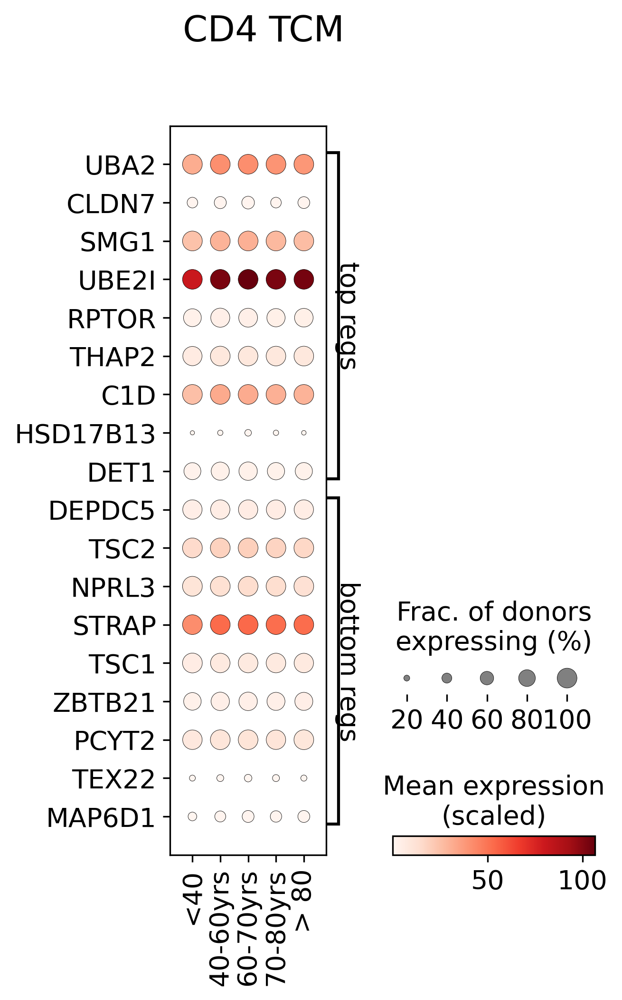

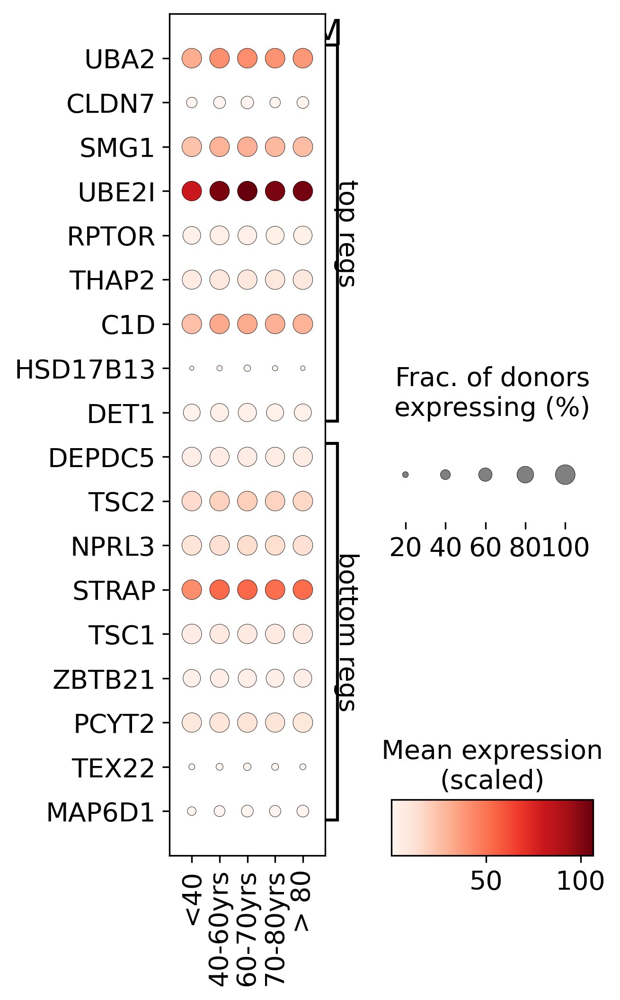

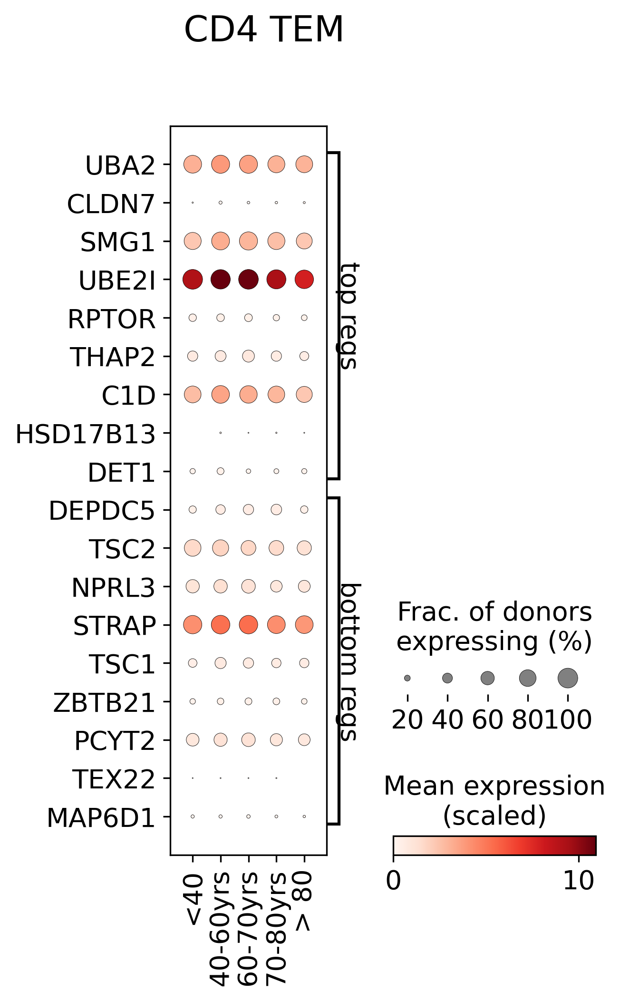

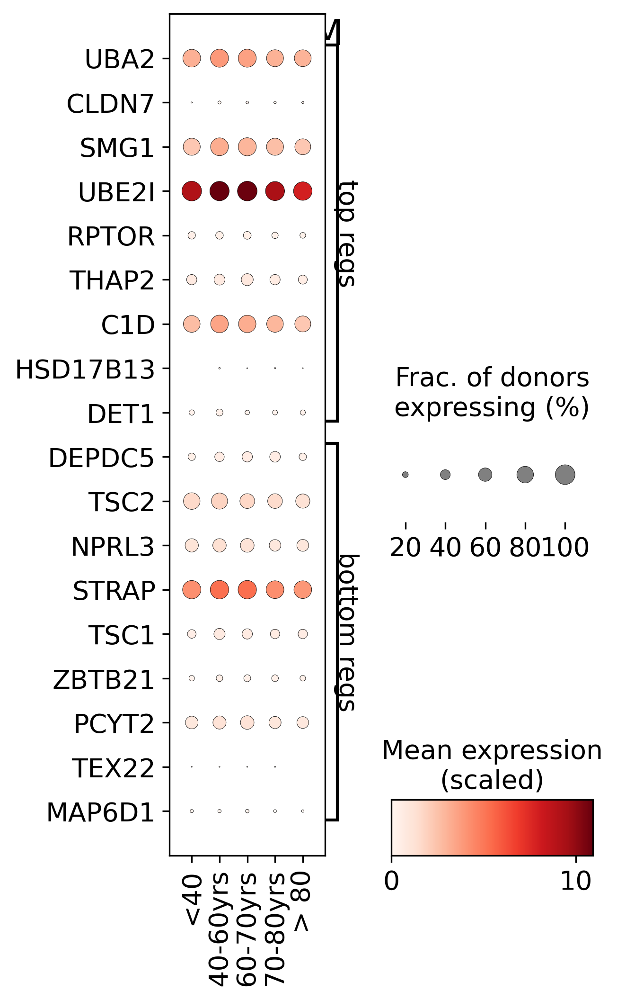

In [26]:
# Get top 5 and bottom 5 genes by absolute zscore for significantly differentially expressed genes
gene_sets = {
    'top regs': ['UBA2',
 'CLDN7',
 'SMG1',
 'UBE2I',
 'RPTOR',
 'THAP2',
 'C1D',
 'HSD17B13',
 'DET1'],
    'bottom regs': ['DEPDC5',
 'TSC2',
 'NPRL3',
 'STRAP',
 'TSC1',
 'ZBTB21',
 'PCYT2',
 'TEX22',
 'MAP6D1']
}

pbulk_adata = sc.read_h5ad(datadir + "Yazar2022_CD4T_processed.pbulk.h5ad")
pbulk_adata.obs_names_make_unique()
pbulk_adata.var['ensembl_id'] = pbulk_adata.var.index
pbulk_adata.var_names = pbulk_adata.var['feature_name']
age_cat_map = {
    1: '<40',
    2: '40-60yrs', 
    3: '60-70yrs',
    4: '70-80yrs',
    5: '> 80'
}
age_order = ['<40', '40-60yrs', '60-70yrs', '70-80yrs', '> 80']
pbulk_adata.obs['age_cat'] = pd.Categorical(pbulk_adata.obs['age_cat'].map(age_cat_map), categories=age_order)

for ct in pbulk_adata.obs['predicted.celltype.l2'].unique():
    pl = sc.pl.DotPlot(pbulk_adata[pbulk_adata.obs['predicted.celltype.l2'] == ct], gene_sets, groupby='age_cat', title=ct) \
    .swap_axes() \
    .style(smallest_dot = 0, largest_dot = 100) \
    .legend(size_title = 'Frac. of donors\nexpressing (%)', colorbar_title = 'Mean expression\n(scaled)', width=2)
    pl.savefig(f'./results/Yazar2022_dotplot_regulators_{ct}.pdf', bbox_inches='tight')
    pl.savefig(f'./results/Yazar2022_dotplot_regulators_{ct}.png', bbox_inches='tight')